# - The project :: Tellecom Chun Classification Project

# -  Describtion of Project ::

* Describtion of project ::
    *************************
    * Business ::
         * Any Business Want To Maximize The Numbers of CLients.
         * That Not Based on Attract New ones Only But Bases also on Retaining the Existing ones.
         * The Current or old Clients Will Cost the Company Less Than The New_Clients
         * The New_Clients Weekly interested in Business Servicies and They consider difficult to work with it But The Retain Clients have the necessary knowldge and info Towardes the Business services.
    * Data :: 
         * We Have data belongings to Tellecom Services Which Present The Behaviour of the Clients with The Business Services 
         * We Have dataset from a telecommunications company. The data contains information about almost six thousand users, their demographic characteristics, the services they use, the duration of using the operator's services, the method of payment, and the amount of payment.
         * We Must Known That  Task of Attract New_Clients More difficulte and need more efforts Than thae task of Keep the old Clients Use Our Business Servicies.
    * Tasks ::
        * *Apply EDA Technice To* :: Describe The Behavior of the data For Extractng Meaningfull Knowledge , insights and Vision From That data To Make The Steckholders of our Business Make More Efficient Decision Which improve and develop The Business
        * Research Of dependences and Formulation of Hypothess.
        * Built ML Model For Predciting New_Values Of Churn.
        * Get High Accuracy From the Model Performance To improve Our Business .

# (1) :: Importing liberaries and Frameworks  ::

In [1]:
# Importing Liberaries and Framworks ::
import numpy as np      # Apply Linear_Algebra oerations.
import pandas as pd     # For Loading data and Apply Wrangling and Mainpulating on data
import seaborn as sns   # For Visualizing data
import warnings as w    # For Ignoring any Warning
import missingno as mno # Presnt Precentage of Nan Values
import datasist as ds   # For Apply EDA and Visualization Using Simple Implementation
import matplotlib.pyplot as plt # For Set Plots , Charts and Maps Labels and Title  
%matplotlib inline      # To Make Matplotlib apply on any Version


UsageError: unrecognized arguments: # To Make Matplotlib apply on any Version


In [ ]:
# To ignore any Warning notification.
w.filterwarnings("ignore") 
# To Set Figsize of Plots , Charts and Maps
sns.set( rc = {"figure.figsize" : [50 , 35]} , font_scale=3.5)

In [2]:
# Loading dataset ::
path = "G:\\Data Field\\D..S..Course\\Kagele_data\\Telco-Customer-Churn.csv.xls"
df = pd.read_csv(path)
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes


* From The Result above we can see Some Obsevations ::
    * We Have 7043 Samples of data.
    * We Have 21 Features of data.
    * Our Target Is Churn Feature
* Data_Features ::
  * *customerID* - customer id
  * *gender* - client gender (male / female)
  * *SeniorCitizen* - whether the client is a pensioner (1, 0)
  * *Partner* - whether the client is married (Yes, No)
  * *Dependents* - does the client have dependents (Yes, No)
  * *tenure* - how many months a person has been a client on the company
  * *PhoneService* - is the telephone service activated (Yes, No)
  * *MultipleLines* - whether multiple telephone lines are connected (Yes, No, No phone service)
  * *InternetService* - client's Internet provider (DSL, Fiber optic, No)
  * *OnlineSecurity* - is the online security service enabled (Yes, No, No internet service)
  * *OnlineBackup* - is the online backup service activated (Yes, No, No internet service)
  * *DeviceProtection* - does the client have equipment insurance (Yes, No, No internet service)
  * *TechSupport* - is the technical support service activated (Yes, No, No internet service)
  * *StreamingTV* - is the streaming TV service activated (Yes, No, No internet service)
  * *StreamingMovies* - is the streaming cinema service activated (Yes, No, No internet service)
  * *Contract* - type of customer contract (Month-to-month, One year, Two year)
  * *PaperlessBilling* - whether the client uses paperless billing (Yes, No)
  * *PaymentMethod* - payment method (Electronic check, Mailed check, Bank transfer (automatic), Credit card (automatic))
  * *MonthlyCharges* - current monthly payment
  * *TotalCharges* - the total amount that the client has paid for the services for the entire time
  * *Churn* - whether there was a churn (Yes or No)
     

* *EDA Task* ::
    *  It one of the most important phase of data scientist life cycle which we apply some statistical oprations toidentify the Behaviour of data  to extract meaningful knowledge , insights and vesion from that data to help steckholders to make more efficient decision which improve and enhance our Buesines.

# (2) :: Statistical analysis Process ::

In [7]:
df.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [8]:
df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
customerID          7043 non-null object
gender              7043 non-null object
SeniorCitizen       7043 non-null int64
Partner             7043 non-null object
Dependents          7043 non-null object
tenure              7043 non-null int64
PhoneService        7043 non-null object
MultipleLines       7043 non-null object
InternetService     7043 non-null object
OnlineSecurity      7043 non-null object
OnlineBackup        7043 non-null object
DeviceProtection    7043 non-null object
TechSupport         7043 non-null object
StreamingTV         7043 non-null object
StreamingMovies     7043 non-null object
Contract            7043 non-null object
PaperlessBilling    7043 non-null object
PaymentMethod       7043 non-null object
MonthlyCharges      7043 non-null float64
TotalCharges        7043 non-null object
Churn               7043 non-null object
dtypes: float64(1), int64(2), obj

* From The Result above we can see some observations ::
    * we don't have Null values.
    * we dont have any datetime feature.
    * we Have 1 feature as float , 3 features as int and 18 features as object.
    * we Found Total_charges is object insted of float64 we must convert it .

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

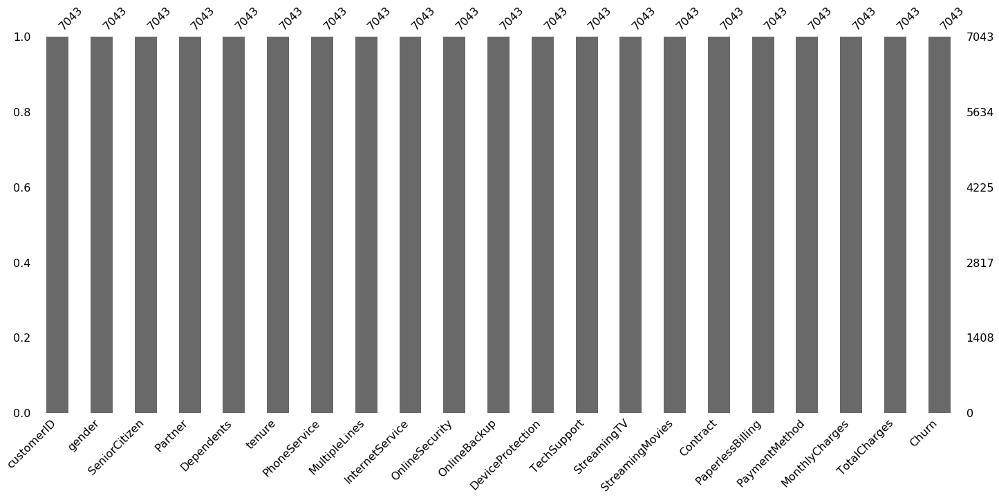

In [10]:
# Investigate Data not include null values ::
# Let's take a look at the presence of missing values, so as not to face unpleasant surprises in the future.


mno.bar(df)
df.isna().sum()

In [11]:
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [12]:
# identify the data values and its values count ::
for col in df.columns :
    print(f"The Col :: ({col})\n\nThe Col _ ({col}) _Unique_values :: {df[col].unique()}\n\n\
The Col _ ({col})_Value_counts :: \n\n{df[col].value_counts()}\n\n-----------\n-----------\n")

The Col :: (customerID)

The Col _ (customerID) _Unique_values :: ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']

The Col _ (customerID)_Value_counts :: 

1945-XISKS    1
7596-IIWYC    1
5073-WXOYN    1
6203-HBZPA    1
6993-YCOBK    1
             ..
5198-EFNBM    1
9800-ONTFE    1
0486-LGCCH    1
5203-XEHAX    1
0234-TEVTT    1
Name: customerID, Length: 7043, dtype: int64

-----------
-----------

The Col :: (gender)

The Col _ (gender) _Unique_values :: ['Female' 'Male']

The Col _ (gender)_Value_counts :: 

Male      3555
Female    3488
Name: gender, dtype: int64

-----------
-----------

The Col :: (SeniorCitizen)

The Col _ (SeniorCitizen) _Unique_values :: [0 1]

The Col _ (SeniorCitizen)_Value_counts :: 

0    5901
1    1142
Name: SeniorCitizen, dtype: int64

-----------
-----------

The Col :: (Partner)

The Col _ (Partner) _Unique_values :: ['Yes' 'No']

The Col _ (Partner)_Value_counts :: 

No     3641
Yes    3402
Name: Partner, dtype: in

In [13]:
# Present the Statistical Analysis describtion of Numerical_data ::
df.describe(include=["number"])

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [14]:
# present the Statistical Analysis description of Categorical_data ::
df.describe(include="object")

,customerID,gender,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,TotalCharges,Churn
count,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043,7043
unique,7043,2,2,2,2,3,3,3,3,3,3,3,3,3,2,4,6531,2
top,1945-XISKS,Male,No,No,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,,No
freq,1,3555,3641,4933,6361,3390,3096,3498,3088,3095,3473,2810,2785,3875,4171,2365,11,5174


* Conclusions that can be drawn at the mom
  * The difference between the sexes of clients is very small - about 50 people (male gender prevails).

  * Most clients have no dependents.

  * 90% of clients have a telephone service connected.
  
  * 60% of Clients Not have MultipleLines.
  
  * 50% of Clients Use Fiber_Optic as InternetServices.
  
  * 60% of Clients Not have Online_Security.
  
  * 50% of Clients Not have Online_BackUp.
  
  * 50% of Clients Not have device_Protection.
  
  * 60% of Clients Not have Tech_Support.
  
  * 50% of Clients Not have Streaming_TV.
  
  * 50% of Clients Not have Streaming_Movies.

  * On average, half of the clients do not use additional services.

  * Half of the clients have a contract type - "From month to month".

  * More than half of customers use paperless billing.
  
  * One third of clients have a payment method - "Electronic check".
  
  * 90% of Clients are not Churn. 


In [15]:
# Present nuniques :: To identifing the duplicaties data
df.nunique()

customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6531
Churn                  2
dtype: int64

In [16]:
# detect duplicaties samples.
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
7038    False
7039    False
7040    False
7041    False
7042    False
Length: 7043, dtype: bool

In [17]:
df.duplicated().sum()

0

In [18]:
# Droping All repeat or Redendant data.
df.drop_duplicates(inplace=True)

* From The Result above we cann see ::
    * data not Have duplicies or repeated data
    * That Becouse Numbers of recordes or samples Ater Drop_duplicies not less Comparing with Them Before Droping.

In [19]:
# Convert dtype of Total_Charges from Oject into Numerical ::
df["TotalCharges"] = pd.to_numeric(df["TotalCharges"] , errors="coerce")


In [20]:
#Checking dtypes of dataset.
df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

# (3) :: Wrangling and Mainplluting data.

In [21]:
# Get The Record Of the Clients who max Total_charge ::
df[df["TotalCharges"] == df["TotalCharges"].max()]


,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
4610,2889-FPWRM,Male,0,Yes,No,72,Yes,Yes,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Bank transfer (automatic),117.8,8684.8,Yes


In [22]:
# Get The Csu_Id Of the Clients who max Total_charge ::
df[df["TotalCharges"] == df["TotalCharges"].max()]["customerID"]

4610    2889-FPWRM
Name: customerID, dtype: object

In [23]:
# Get The PaymentMethod Of the Clients who max Total_charge ::
df[df["TotalCharges"] == df["TotalCharges"].max()]["PaymentMethod"]

4610    Bank transfer (automatic)
Name: PaymentMethod, dtype: object

In [24]:
# Get The Contract Of the Clients who max Total_charge ::
df[df["TotalCharges"] == df["TotalCharges"].max()]["Contract"]

4610    One year
Name: Contract, dtype: object

In [25]:
# Get The InternetService Of the Clients who max Total_charge ::
df[df["TotalCharges"] == df["TotalCharges"].max()]["InternetService"]

4610    Fiber optic
Name: InternetService, dtype: object

In [26]:
# Get The gender Of the Clients who max Total_charge ::
df[df["TotalCharges"] == df["TotalCharges"].max()]["gender"]

4610    Male
Name: gender, dtype: object

In [27]:
# Get The Record of the Min Total_charges ::
df[df["TotalCharges"] == df["TotalCharges"].min()]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
1654,2967-MXRAV,Male,0,Yes,Yes,1,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,No,Mailed check,18.8,18.8,No


In [28]:
# Get The customerID of the Min Total_charges ::
df[df["TotalCharges"] == df["TotalCharges"].min()]["customerID"]

1654    2967-MXRAV
Name: customerID, dtype: object

In [29]:
# Get The gender of the Min Total_charges ::
df[df["TotalCharges"] == df["TotalCharges"].min()]["gender"]

1654    Male
Name: gender, dtype: object

In [30]:
# Get The Contract of the Min Total_charges ::
df[df["TotalCharges"] == df["TotalCharges"].min()]["Contract"]

1654    One year
Name: Contract, dtype: object

In [31]:
# Get The PaymentMethod of the Min Total_charges ::
df[df["TotalCharges"] == df["TotalCharges"].min()]["PaymentMethod"]

1654    Mailed check
Name: PaymentMethod, dtype: object

In [32]:
# Get The Churn of the Min Total_charges ::
df[df["TotalCharges"] == df["TotalCharges"].min()]["Churn"]

1654    No
Name: Churn, dtype: object

In [33]:
# Get The Record of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].max()]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
4586,7569-NMZYQ,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),118.75,8672.45,No


In [34]:
# Get The customerID of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].max()]["customerID"]

4586    7569-NMZYQ
Name: customerID, dtype: object

In [35]:
# Get The gender of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].max()]["gender"]

4586    Female
Name: gender, dtype: object

In [36]:
# Get The Partner of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].max()]["Partner"]

4586    Yes
Name: Partner, dtype: object

In [37]:
# Get The InternetService of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].max()]["InternetService"]

4586    Fiber optic
Name: InternetService, dtype: object

In [38]:
# Get The Contract of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].max()]["Contract"]

4586    Two year
Name: Contract, dtype: object

In [39]:
# Get The PaymentMethod of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].max()]["PaymentMethod"]

4586    Bank transfer (automatic)
Name: PaymentMethod, dtype: object

In [40]:
# Get The Record of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].min()]

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
3719,6823-SIDFQ,Male,0,No,No,28,Yes,No,No,No internet service,...,No internet service,No internet service,No internet service,No internet service,One year,No,Credit card (automatic),18.25,534.7,No


In [41]:
# Get The customerID of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].min()]["customerID"]

3719    6823-SIDFQ
Name: customerID, dtype: object

In [42]:
# Get The gender of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].min()]["gender"]

3719    Male
Name: gender, dtype: object

In [43]:
# Get The Contract of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].min()]["Contract"]

3719    One year
Name: Contract, dtype: object

In [44]:
# Get The PaymentMethod of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].min()]["PaymentMethod"]

3719    Credit card (automatic)
Name: PaymentMethod, dtype: object

In [45]:
# Get The Churn of the Min MonthlyCharges ::
df[df["MonthlyCharges"] == df["MonthlyCharges"].min()]["Churn"]

3719    No
Name: Churn, dtype: object

In [46]:
df.groupby("Contract").describe().transpose()

Contract              Month-to-month     One year     Two year
SeniorCitizen  count     3875.000000  1473.000000  1695.000000
               mean         0.208258     0.128988     0.085546
               std          0.406115     0.335301     0.279775
               min          0.000000     0.000000     0.000000
               25%          0.000000     0.000000     0.000000
               50%          0.000000     0.000000     0.000000
               75%          0.000000     0.000000     0.000000
               max          1.000000     1.000000     1.000000
tenure         count     3875.000000  1473.000000  1695.000000
               mean        18.036645    42.044807    56.735103
               std         17.689054    19.035883    18.209363
               min          1.000000     0.000000     0.000000
               25%          3.000000    27.000000    48.000000
               50%         12.000000    44.000000    64.000000
               75%         29.000000    58.000000    71.000000
               max         72.000000    72.000000    72.000000
MonthlyCharges count     3875.000000  1473.000000  1695.000000
               mean        66.398490    65.048608    60.770413
               std         26.926599    31.840539    34.678865
               min         18.750000    18.250000    18.400000
               25%         45.850000    26.900000    24.025000
               50%         73.250000    68.750000    64.350000
               75%         88.875000    94.800000    90.450000
               max        117.450000   118.600000   118.750000
TotalCharges   count     3875.000000  1472.000000  1685.000000
               mean      1369.254581  3034.683084  3728.933947
               std       1613.879008  2229.730075  2571.252806
               min         18.850000    18.800000    20.350000
               25%        160.100000   989.350000  1278.800000
               50%        679.550000  2657.550000  3623.950000
               75%       2066.500000  4859.525000  5999.850000
               max       8061.500000  8684.800000  8672.450000

In [47]:
df.groupby("PaymentMethod").describe().transpose()

PaymentMethod         Bank transfer (automatic)  Credit card (automatic)  \
SeniorCitizen  count                1544.000000              1522.000000   
               mean                    0.150907                 0.145204   
               std                     0.358074                 0.352422   
               min                     0.000000                 0.000000   
               25%                     0.000000                 0.000000   
               50%                     0.000000                 0.000000   
               75%                     0.000000                 0.000000   
               max                     1.000000                 1.000000   
tenure         count                1544.000000              1522.000000   
               mean                   43.656736                43.269382   
               std                    23.197901                23.339581   
               min                     0.000000                 0.000000   
               25%                    23.000000                23.000000   
               50%                    48.000000                47.000000   
               75%                    66.000000                66.000000   
               max                    72.000000                72.000000   
MonthlyCharges count                1544.000000              1522.000000   
               mean                   67.192649                66.512385   
               std                    30.555200                30.612424   
               min                    18.400000                18.250000   
               25%                    41.087500                38.662500   
               50%                    73.100000                73.025000   
               75%                    92.962500                90.850000   
               max                   118.750000               117.500000   
TotalCharges   count                1542.000000              1521.000000   
               mean                 3079.299546              3071.396022   
               std                  2357.735491              2407.402613   
               min                    19.250000                19.300000   
               25%                  1052.362500               989.050000   
               50%                  2474.650000              2453.300000   
               75%                  4943.150000              5016.250000   
               max                  8684.800000              8670.100000   

PaymentMethod         Electronic check  Mailed check  
SeniorCitizen  count       2365.000000   1612.000000  
               mean           0.251163      0.058313  
               std            0.433774      0.234406  
               min            0.000000      0.000000  
               25%            0.000000      0.000000  
               50%            0.000000      0.000000  
               75%            1.000000      0.000000  
               max            1.000000      1.000000  
tenure         count       2365.000000   1612.000000  
               mean          25.174630     21.830025  
               std           22.382301     21.218374  
               min            1.000000      0.000000  
               25%            5.000000      3.000000  
               50%           18.000000     15.000000  
               75%           43.000000     36.000000  
               max           72.000000     72.000000  
MonthlyCharges count       2365.000000   1612.000000  
               mean          76.255814     43.917060  
               std           24.053655     26.314665  
               min           18.850000     18.700000  
               25%           60.150000     20.150000  
               50%           80.550000     34.700000  
               75%           94.700000     64.912500  
               max          118.650000    118.600000  
TotalCharges   count       2365.000000   1604.000000  
               mean        2090.868182   1054.483915  
      

In [48]:
df.groupby("Churn").describe().transpose()

Churn                          No          Yes
SeniorCitizen  count  5174.000000  1869.000000
               mean      0.128721     0.254682
               std       0.334923     0.435799
               min       0.000000     0.000000
               25%       0.000000     0.000000
               50%       0.000000     0.000000
               75%       0.000000     1.000000
               max       1.000000     1.000000
tenure         count  5174.000000  1869.000000
               mean     37.569965    17.979133
               std      24.113777    19.531123
               min       0.000000     1.000000
               25%      15.000000     2.000000
               50%      38.000000    10.000000
               75%      61.000000    29.000000
               max      72.000000    72.000000
MonthlyCharges count  5174.000000  1869.000000
               mean     61.265124    74.441332
               std      31.092648    24.666053
               min      18.250000    18.850000
               25%      25.100000    56.150000
               50%      64.425000    79.650000
               75%      88.400000    94.200000
               max     118.750000   118.350000
TotalCharges   count  5163.000000  1869.000000
               mean   2555.344141  1531.796094
               std    2329.456984  1890.822994
               min      18.800000    18.850000
               25%     577.825000   134.500000
               50%    1683.600000   703.550000
               75%    4264.125000  2331.300000
               max    8672.450000  8684.800000

In [49]:
# Create Pivote_Table Using tat data ::

Pivot_T1 = pd.pivot_table(df , index = "PaymentMethod" , columns = "Contract" , values = "MonthlyCharges")
Pivot_T1

Contract,Month-to-month,One year,Two year
PaymentMethod,,,
Bank transfer (automatic),69.085399,67.484143,65.013918
Credit card (automatic),67.678821,67.972362,64.422117
Electronic check,74.989486,79.095245,84.335714
Mailed check,46.050056,44.306380,38.587304


In [50]:
Pivot_T2 = pd.pivot_table(df , index = "Contract" , columns = "PaymentMethod" , values = "TotalCharges")
Pivot_T2

PaymentMethod,Bank transfer (automatic),Credit card (automatic),Electronic check,Mailed check
Contract,,,,
Month-to-month,1887.450424,1805.886188,1471.328541,550.503024
One year,3313.006650,3357.256658,3853.272911,1483.315625
Two year,4165.811388,4060.015517,5272.974702,1870.397200


In [51]:
Con_Matrix = df.corr()
Con_Matrix

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
SeniorCitizen,1.000000,0.016567,0.220173,0.102411
tenure,0.016567,1.000000,0.247900,0.825880
MonthlyCharges,0.220173,0.247900,1.000000,0.651065
TotalCharges,0.102411,0.825880,0.651065,1.000000


# (4) :: Visualization data  Task ::

(array([0.5, 1.5, 2.5, 3.5]), <a list of 4 Text yticklabel objects>)

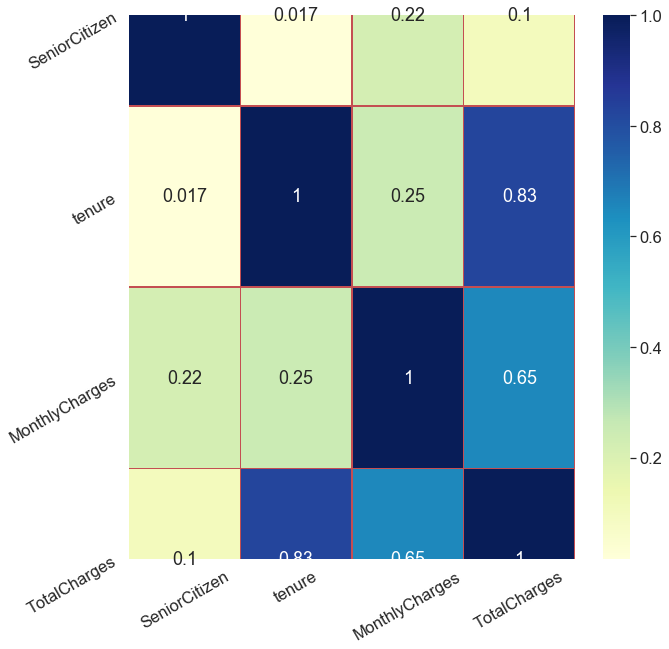

In [52]:
# Visualize The Feathure Correlations ::
sns.set( rc = {"figure.figsize" : [10 , 10]} , font_scale=1.5)
sns.heatmap(Con_Matrix , annot=True , cmap="YlGnBu" , linecolor="r" , linewidths=0.5)
plt.xticks(rotation = 30)
plt.yticks(rotation = 30)
plt.title("Confusion_Matrix of data")
# RdGy_r, RdPu, RdPu_r, RdYlBu, RdYlBu_r, RdYlGn, RdYlGn_r, Reds, Reds_r

In [53]:
# To Present Sex of Clients ::
genders = df["gender"].value_counts()
genders

Male      3555
Female    3488
Name: gender, dtype: int64

* From The Resulte above we can see ::
    * Male Clients larger Female Clients by Few numbers 114 Client.

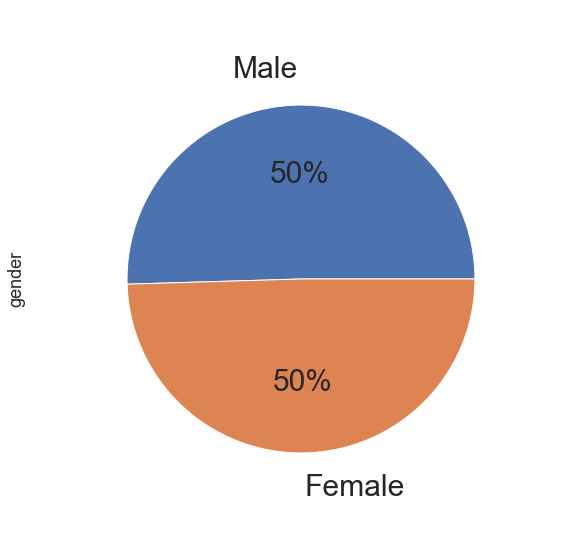

In [54]:
# Visualize Comparing aMonge Male and Female ::
sns.set( rc = {"figure.figsize" : [20 ,20]} , font_scale=1.5)
genders.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize = 30)
plt.title("Pie Chart of Gender")
plt.show()

* From The result above we can see ::
    * The Precentage of Male Clients (51%) and  of Female Clients (49%).

In [55]:
Senior_Citizen = df["SeniorCitizen"].value_counts()
Senior_Citizen

0    5901
1    1142
Name: SeniorCitizen, dtype: int64

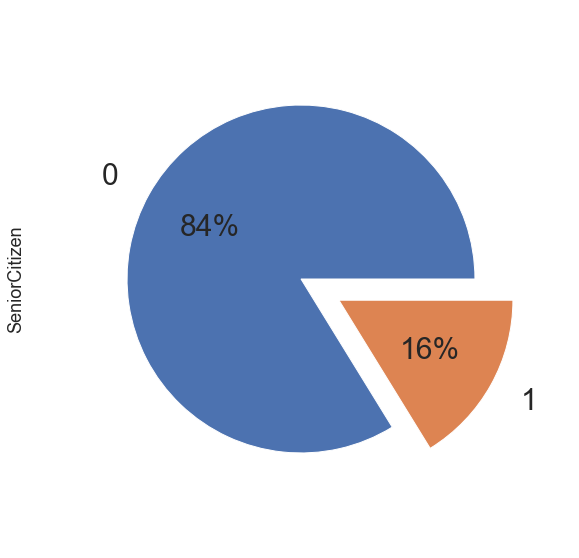

In [56]:
Senior_Citizen.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize = 30 , explode =[0 , 0.2] )
plt.title("Pie Chart of Senior_Citizen")

* From The Result of The Senior_citizen Pie Chat we cann see That ::
    * The Precentage of zero more hue as (84%) and of one (16%).

In [57]:
Partners = df["Partner"].value_counts()
Partners

No     3641
Yes    3402
Name: Partner, dtype: int64

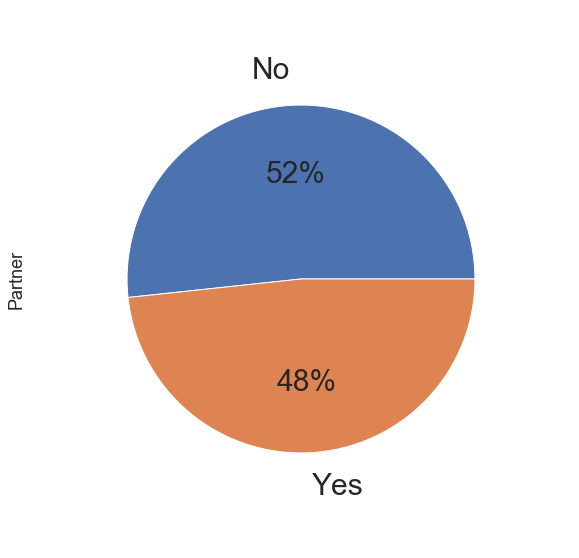

In [58]:
Partners.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize = 30)
plt.title("Pie Chart of Partners")

* From The result above we can see ::
    * The Precentage of not married Clients (51%) and  of married Clients (49%).

In [59]:
Muli_Lines = df["MultipleLines"].value_counts()
Muli_Lines

No                  3390
Yes                 2971
No phone service     682
Name: MultipleLines, dtype: int64

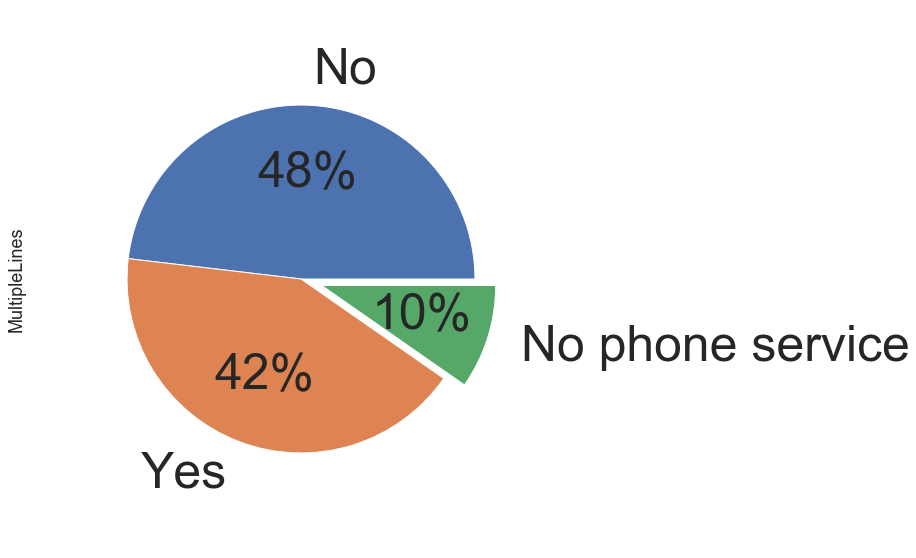

In [60]:
Muli_Lines.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize = 50 ,explode = [0 , 0 , 0.1])
plt.title("Pie Chart of Muli_Lines")

* From The Result Above of The Mulitiple_Lines Pie Chart we can see ::
    * The Precentage of The Clients who Not have Multi_Lines are largest as(48%).
    * The Precentage of The Clients who have Multi_Lines are less few than clients have Multi_lines as(43%).
    * The Precentage of the Clients Who not have Phone_Sevices are the lest Clients as (10%).

In [61]:
Internet_Services = df["InternetService"].value_counts()
Internet_Services

Fiber optic    3096
DSL            2421
No             1526
Name: InternetService, dtype: int64

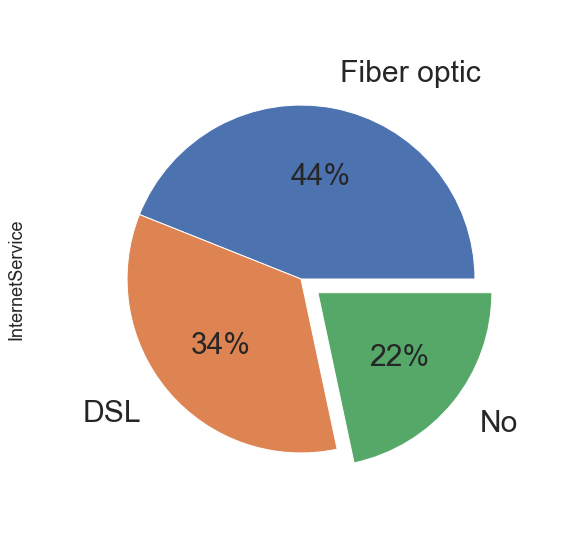

In [62]:
Internet_Services.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize = 30 ,explode =[0,0,0.1])
plt.title("Pie Chart of Internet_Services")

* From The Result above of The InternetService pie chart we can see ::
    * The Precentage of The Client who use  Fiber_optic largest services as (44%).
    * The Precentage of the Clients who use DSL less few comparing with Fiber user as (35%).
    * The Precentage Of the Clients Who Not Use that Services is (22%).

In [63]:
Online_Security = df["OnlineSecurity"].value_counts()
Online_Security

No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64

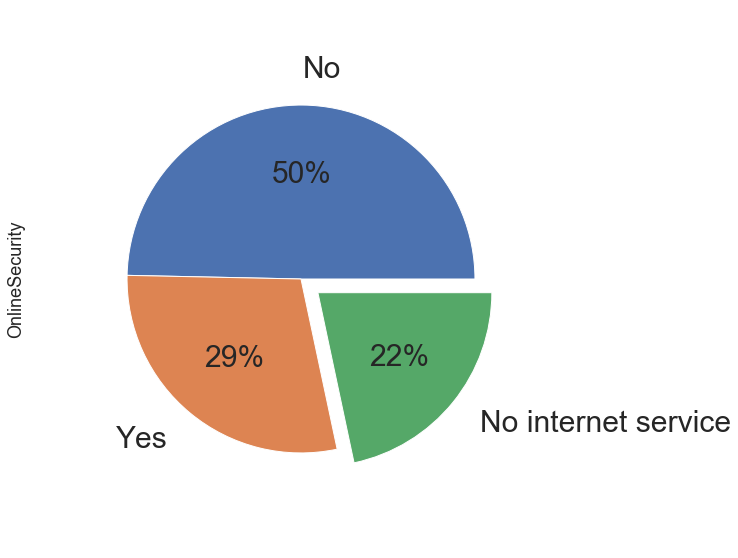

In [64]:
Online_Security.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize = 30 , explode = [0,0,0.1])
plt.title("Pie Chart of Online_Security")

* From The Result above of The OnlineSecurity pie chart we can see ::
    * The Precentage of The Client who Not Use OnlineSecurity are Largest type  as (50%).
    * The Precentage of the Clients who use OnlineSecurity less more comparing with not use that services user as (29%).
    * The Precentage Of the Clients Who Not Use internet Services is (22%).

In [65]:
contracts = df["Contract"].value_counts()
contracts

Month-to-month    3875
Two year          1695
One year          1473
Name: Contract, dtype: int64

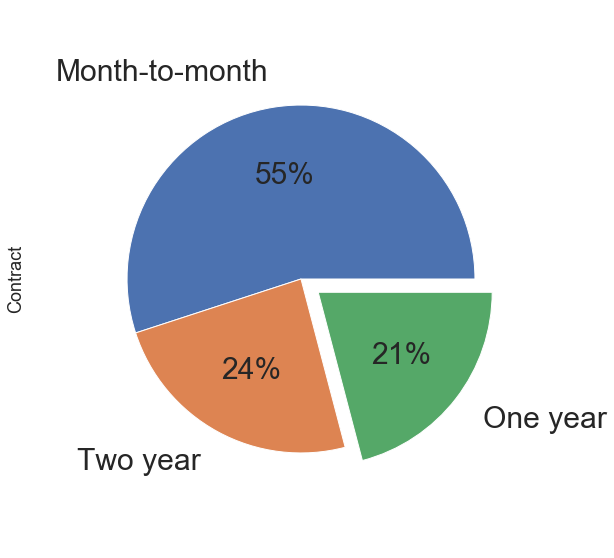

In [66]:
contracts.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize = 30 ,explode = [0,0,0.1])
plt.title("Pie Chart of contracts")

* From the result above  of the contract Pie chart we can see That ::
    * The contact Precentage largest on (Month_To_Month) as (55%).
    * The Contract precentage lesst on (Two_Year) as (24%) and On (Oe_Year) as (21%).

In [67]:
PeperBillning = df["PaperlessBilling"].value_counts()
PeperBillning

Yes    4171
No     2872
Name: PaperlessBilling, dtype: int64

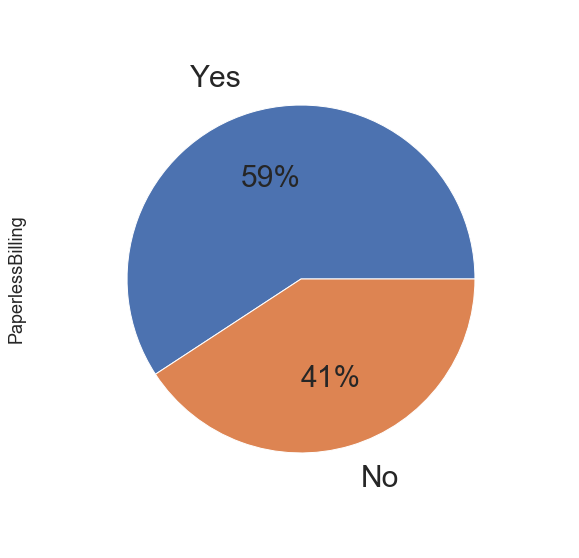

In [68]:
PeperBillning.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize = 30)
plt.title("Pie Chart of PeperBillning")

* From the result above of The PaperlessBilling Pie Chart we can see that :: 
    * The Precentage of lients use PaperlessBilling is large as (59%).
    * The Precentage of clients use PaperlessBilling less few as (41%).

In [69]:
Pay_Methods = df["PaymentMethod"].value_counts()
Pay_Methods

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: PaymentMethod, dtype: int64

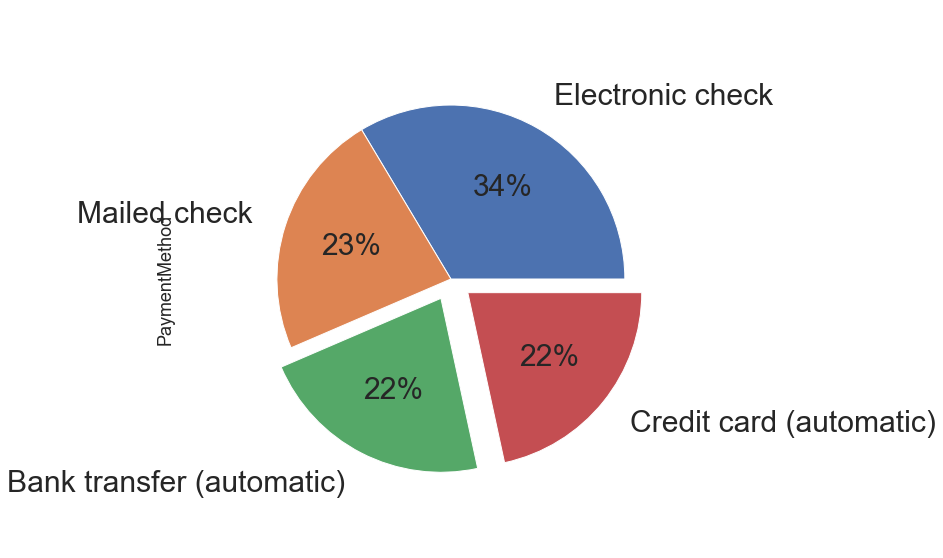

In [70]:
Pay_Methods.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize =30 , explode= [0,0,0.1,0.1])
plt.title("Pie Chart of Pay_Methods")

* From The result above of Pay_Methods Pie chart we can see that ::
    * (34%) of Clients Use Electronic check .
    * (23%) of Clients Use Mailed check.
    * (22%) Of clients Use Bank transfer (automatic) and Credit card (automatic)

In [71]:
churn = df["Churn"].value_counts()
churn

No     5174
Yes    1869
Name: Churn, dtype: int64

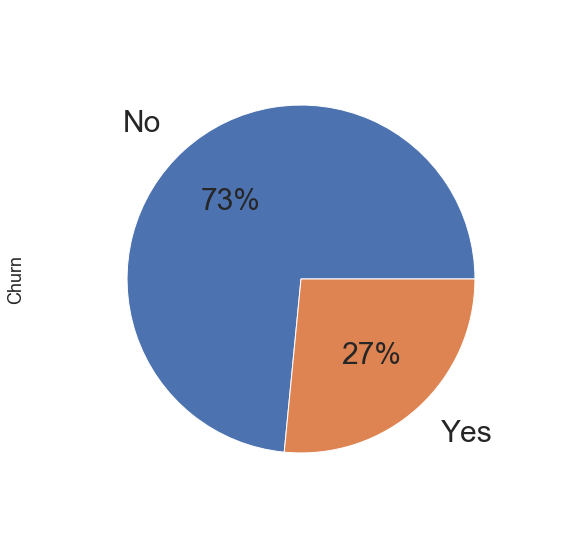

In [72]:
churn.plot.pie(autopct = "%1.0f%%" , radius = 0.8 , labeldistance = 1.2 , fontsize = 30)
plt.title("Pie Chart of churn")

* From The result above of Churn Pie Chart we can see that ::
    * (73%) of Clients are Not Churn .
    * (27%) of Clients are  Churn .

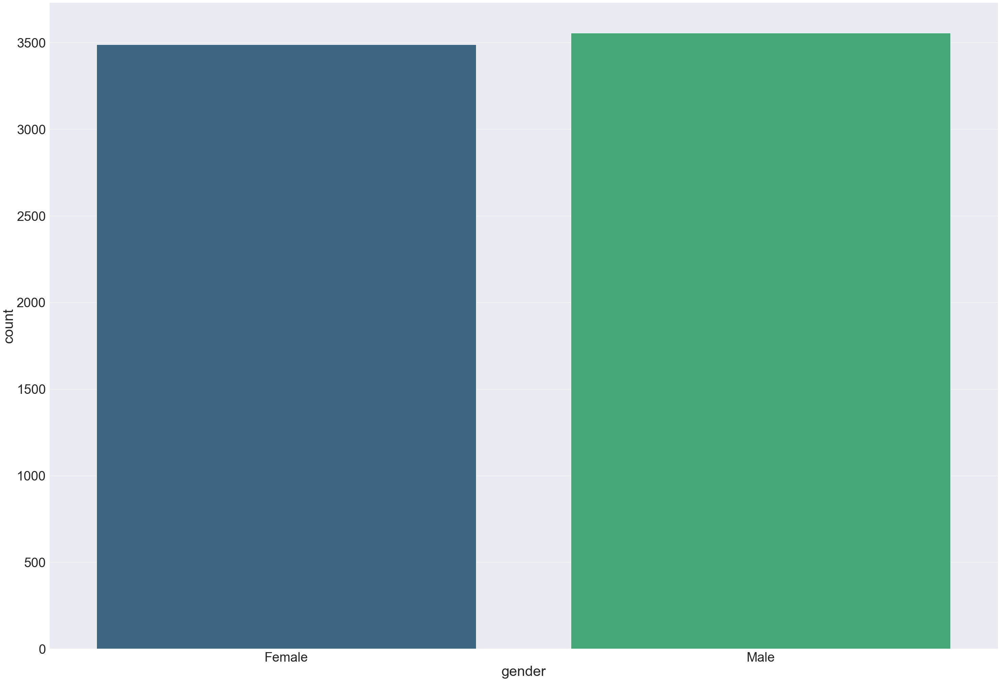

In [73]:
sns.set( rc = {"figure.figsize" : [50 , 35]} , font_scale=3.5)
sns.countplot(df["gender"] , data = df , palette="viridis")
plt.title("Count Plot of Gender")

* From The Result above we can see that ::
    * Numbers of Male Clients are Lareg less From The Numbers of Female Clients .

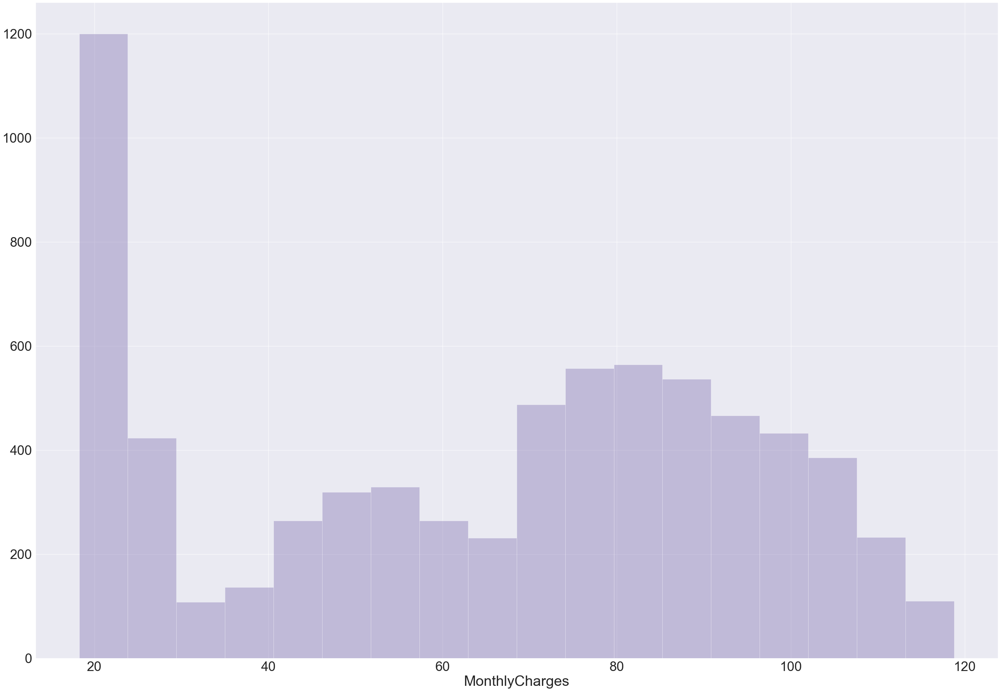

In [74]:
sns.distplot(df["MonthlyCharges"] , kde=False , color="m")
plt.title("Distribution Plot of MonthlyCharges")

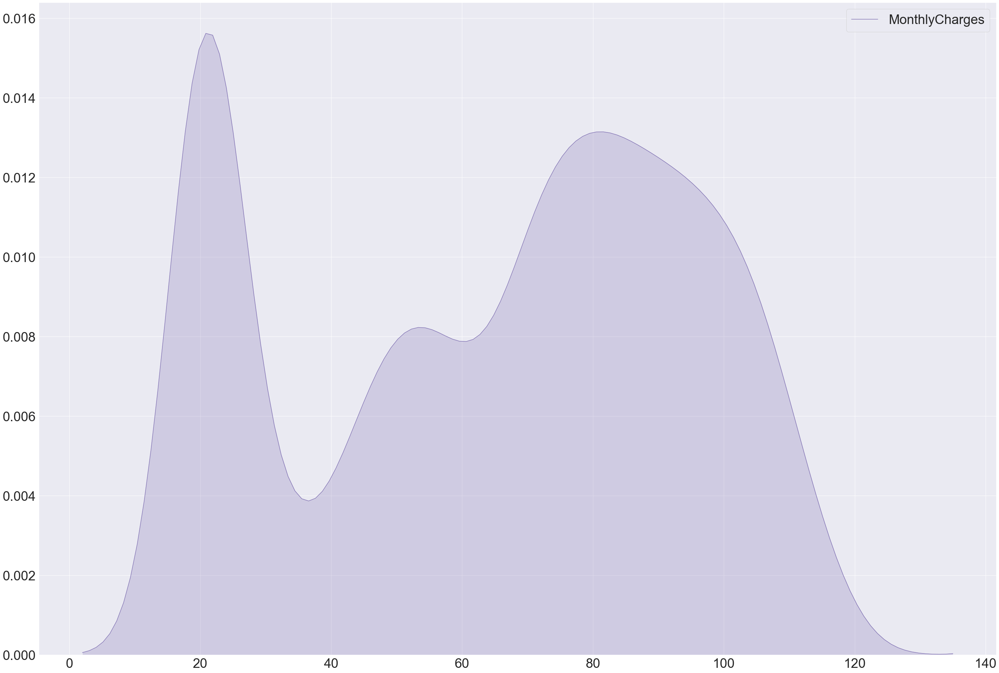

In [75]:
sns.kdeplot(df["MonthlyCharges"] , shade=True , color="m")
plt.title("Kde Plot of MonthlyCharges")

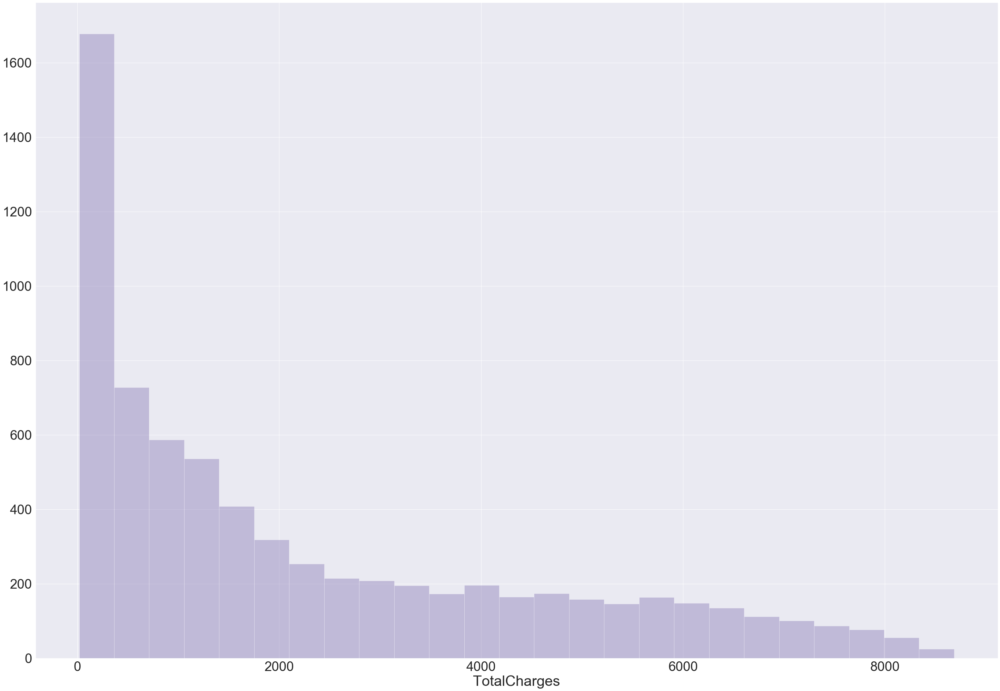

In [76]:
df["TotalCharges"].fillna(df["TotalCharges"].mean() , inplace=True)
sns.distplot(df["TotalCharges"] , kde=False , color="m")
plt.title("Distribution Plot of TotalCharges")

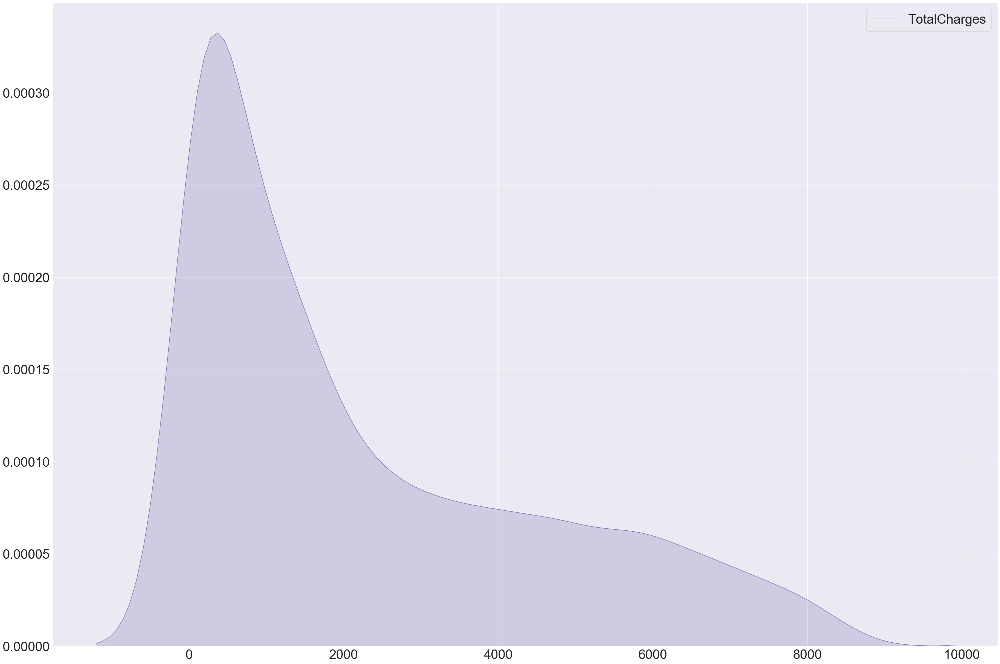

In [77]:
sns.kdeplot(df["TotalCharges"] , shade=True , color="m")
plt.title("Kde Plot of TotalCharges")

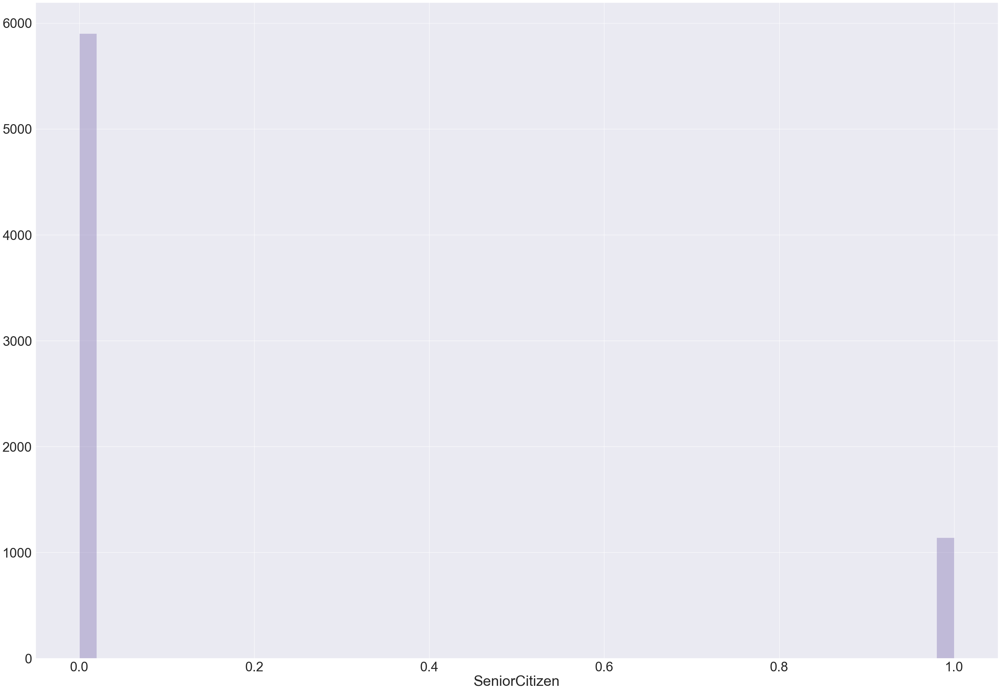

In [78]:
sns.distplot(df["SeniorCitizen"] , kde=False , color="m")
plt.title("Distribution Plot of SeniorCitizen")

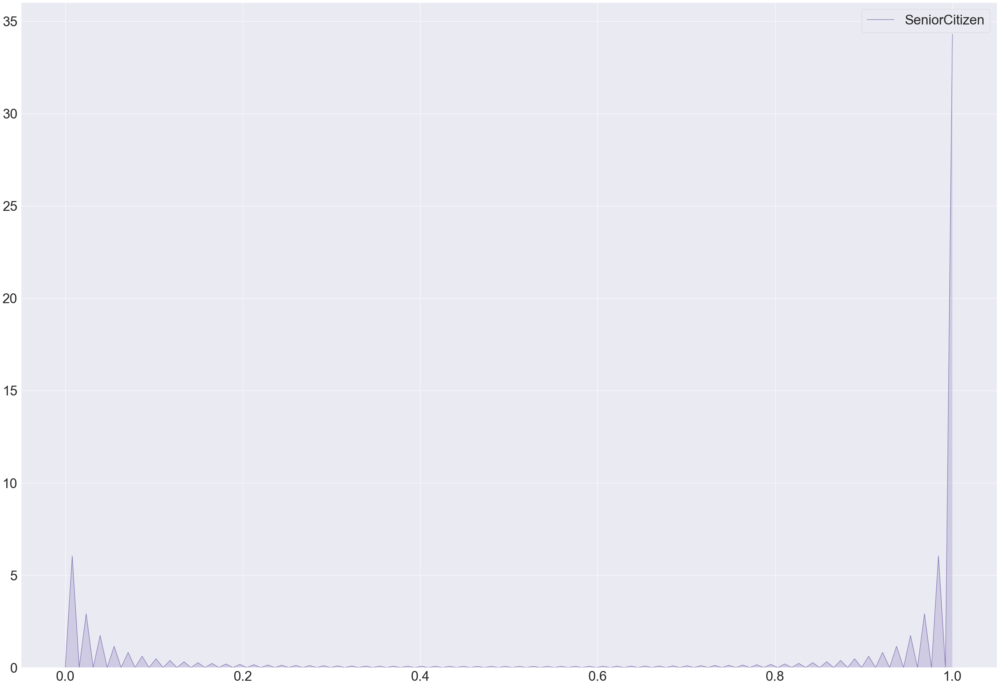

In [79]:
sns.kdeplot(df["SeniorCitizen"] , shade=True , color="m")
plt.title("Kde Plot of SeniorCitizen")

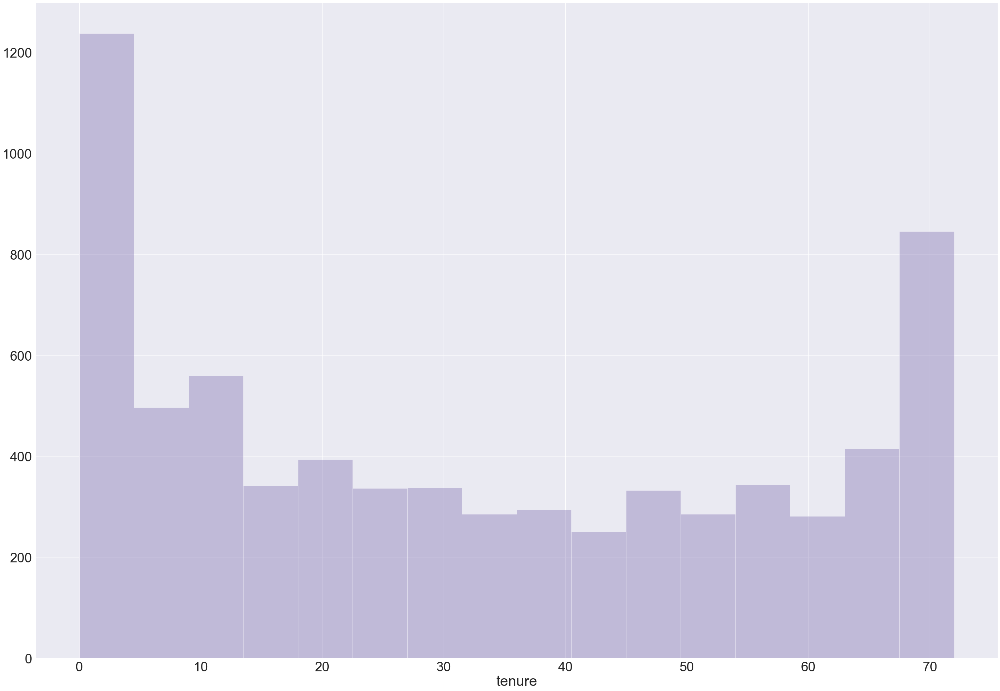

In [80]:
sns.distplot(df["tenure"] , kde=False , color="m")
plt.title("Distribution Plot of tenure")

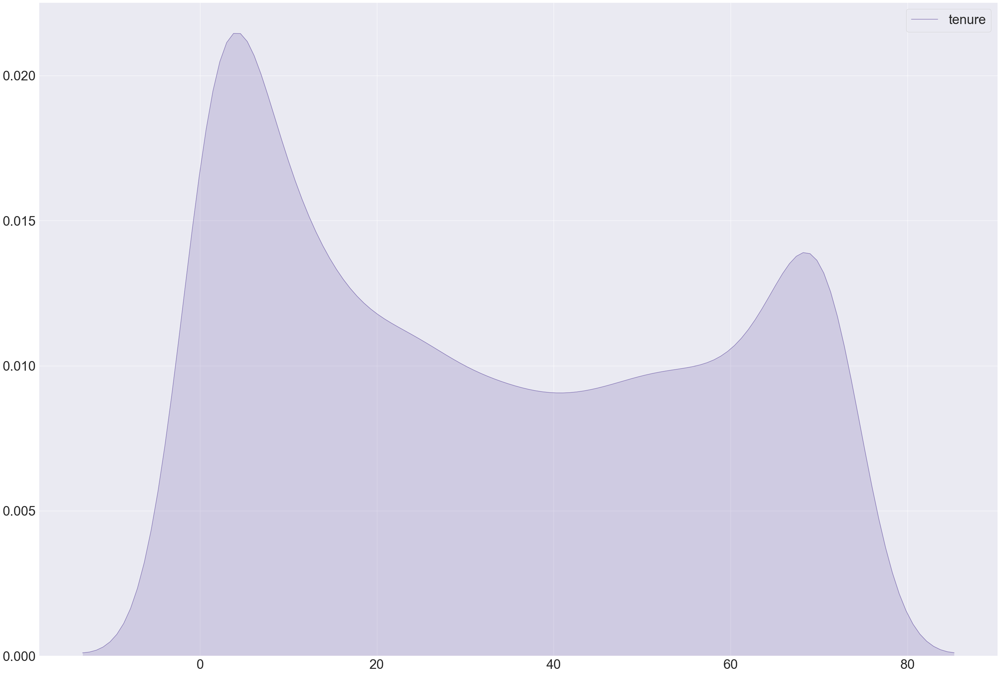

In [81]:
sns.kdeplot(df["tenure"] , shade=True , color="m")
plt.title("Kde Plot of tenure")

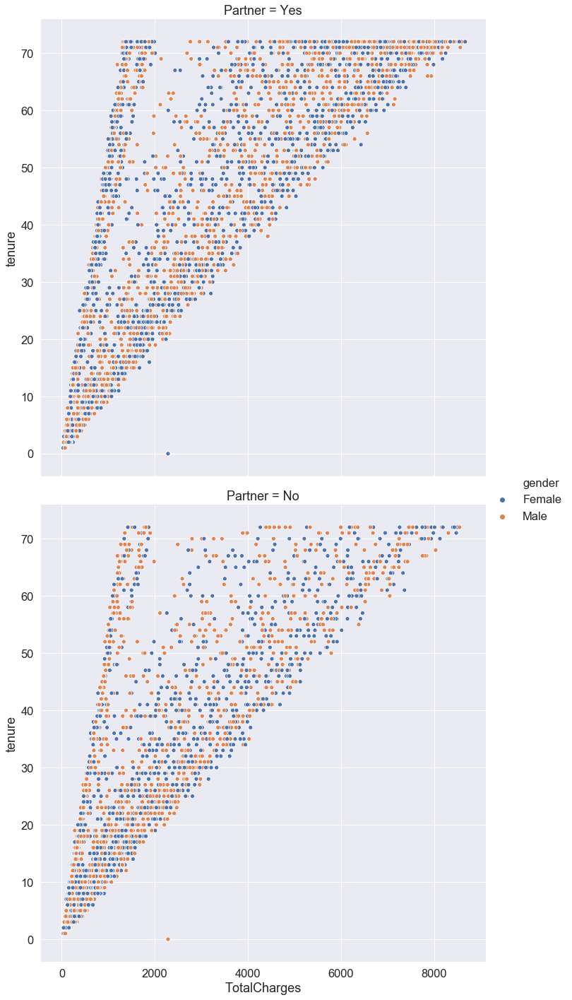

In [82]:
sns.set( rc = {"figure.figsize" : [50 , 35]} , font_scale=1.5)

sns.relplot( x = "TotalCharges"  , y = "tenure" ,data=df , hue="gender" ,height=10 , col = "Partner" , col_wrap=1)
plt.title("Regular Plot of TotalCharges and tenure")

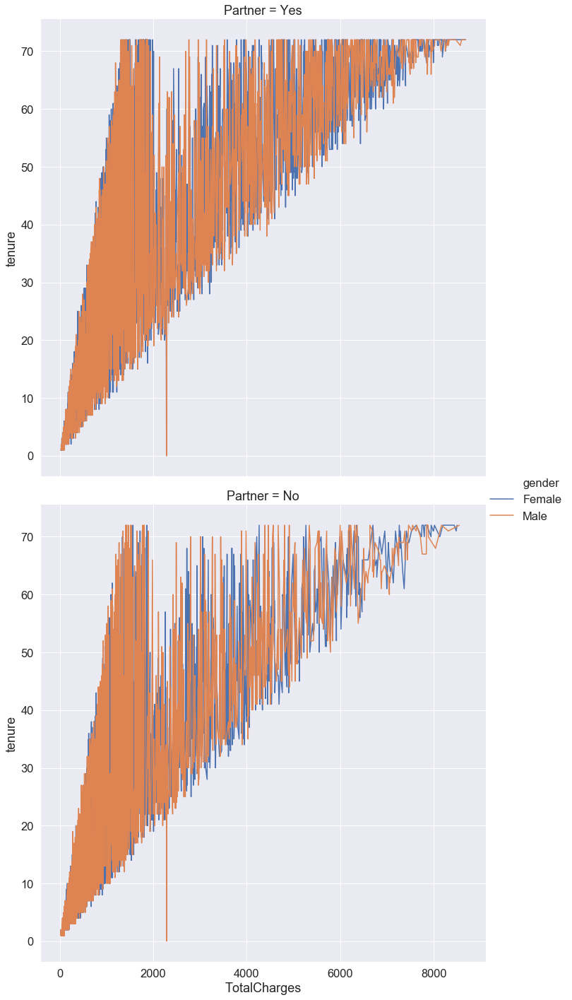

In [83]:
sns.relplot( x = "TotalCharges"  , y = "tenure" ,data=df , hue="gender" ,height=10 , col = "Partner" , col_wrap=1 ,kind="line")

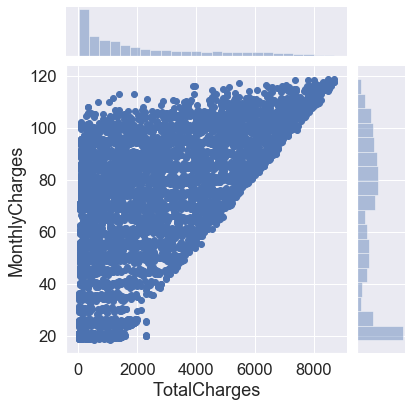

In [84]:
sns.jointplot( x = "TotalCharges" , y = "MonthlyCharges" , data = df , kind = "scatter"  )
plt.title("Joint Plot of  TotalCharges and MonthlyCharges")

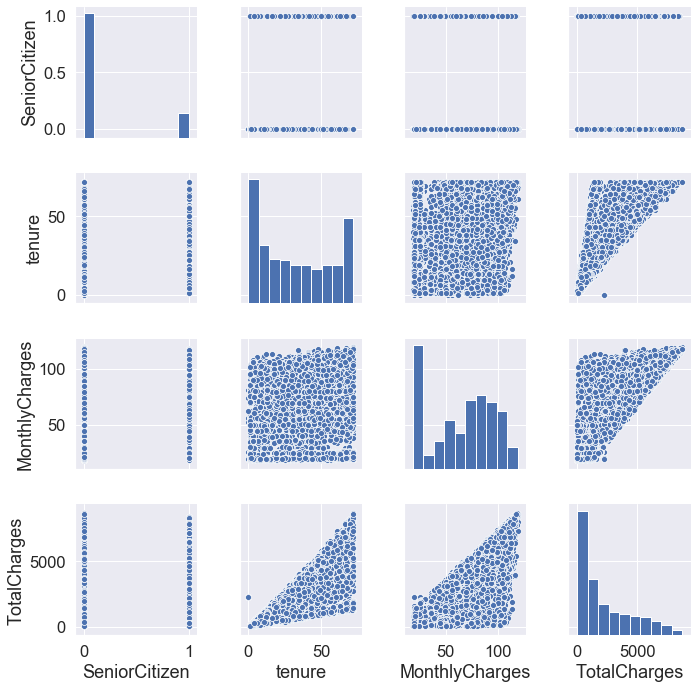

In [85]:
sns.pairplot(df)
plt.title("Pair Plot of df")

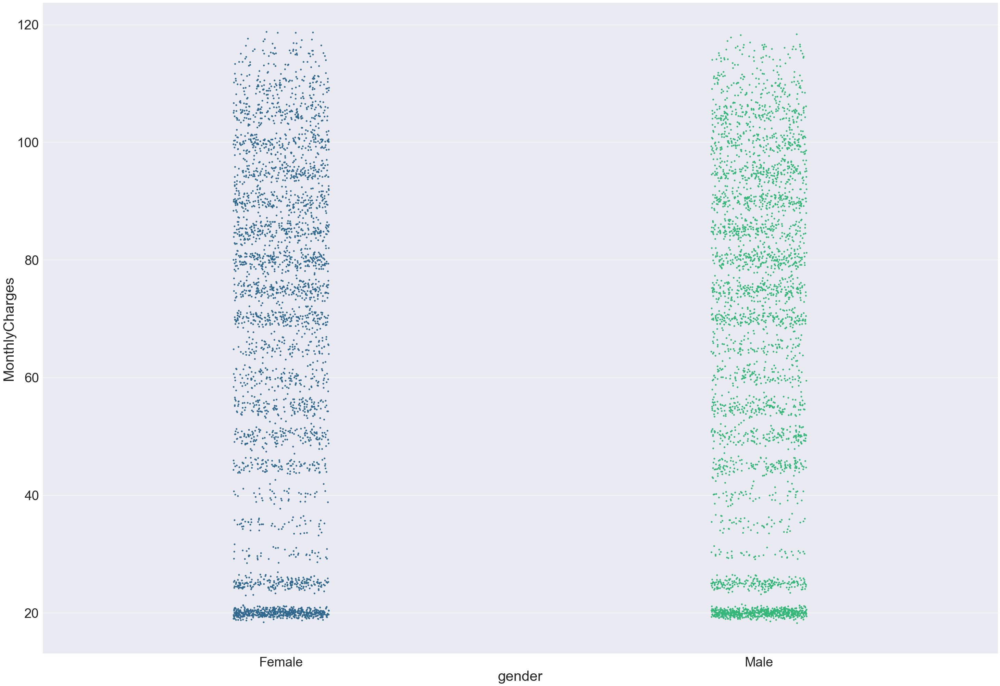

In [86]:
sns.set( rc = {"figure.figsize" : [50 , 35]} , font_scale=3.5)

sns.stripplot( x = "gender" , y = "MonthlyCharges" , data = df , palette="viridis")
plt.title("Strip Plot of gender and MonthlyCharges")

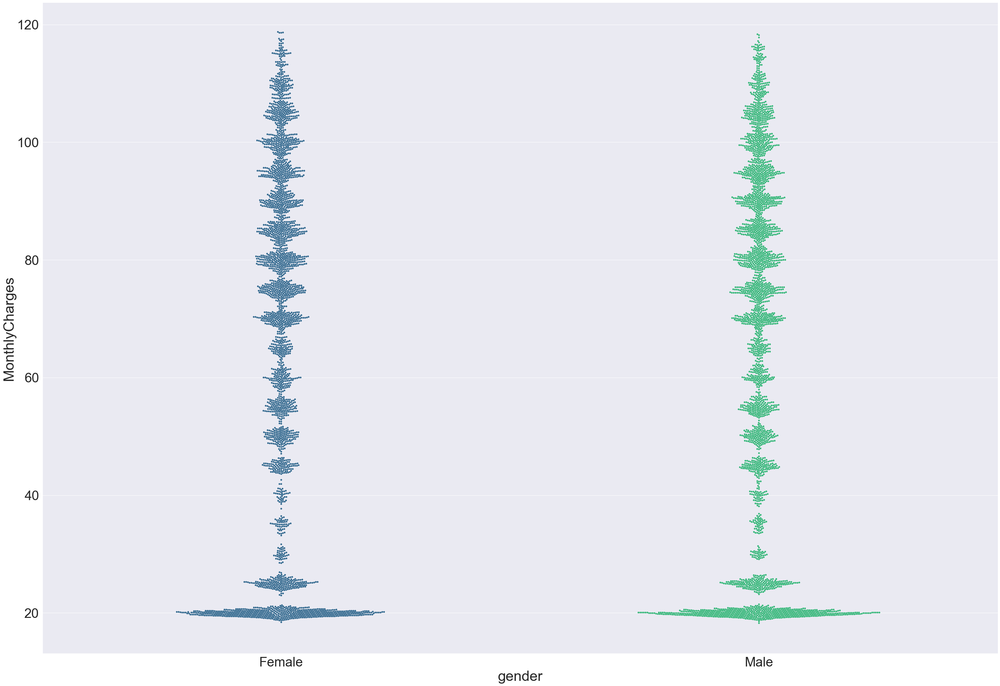

In [87]:
sns.swarmplot( x = "gender" , y = "MonthlyCharges" , data = df , palette="viridis")
plt.title("Swarm Plot of gender and MonthlyCharges")

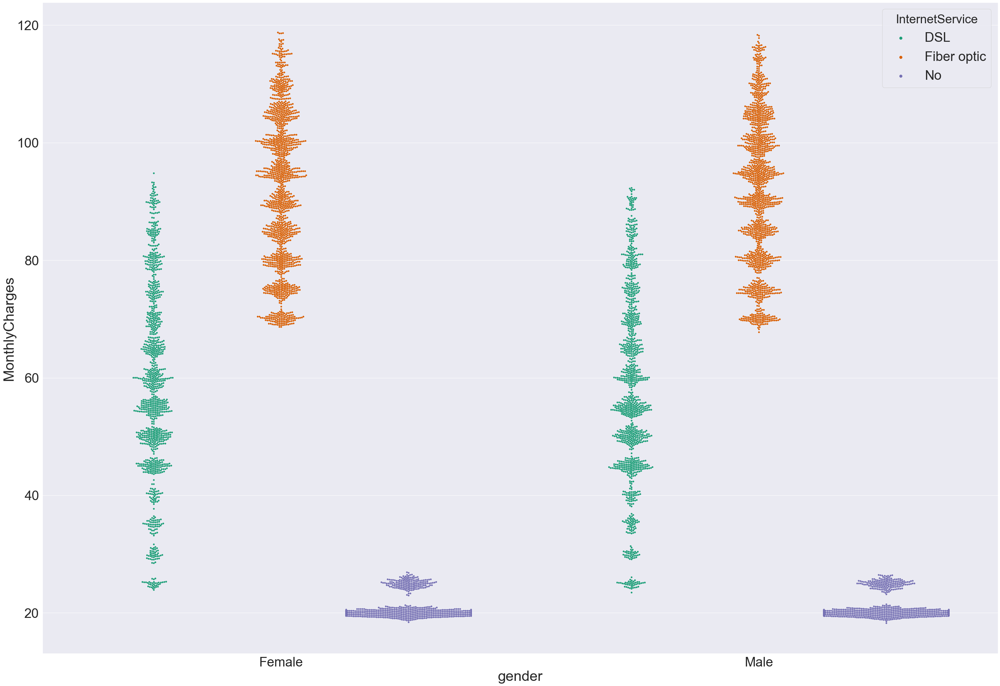

In [88]:
sns.swarmplot( x = "gender" , y = "MonthlyCharges" , data = df ,hue = "InternetService" ,  palette="Dark2" , dodge=True)
plt.title("Swarm Plot of gender and MonthlyCharges Based on InternetService ")

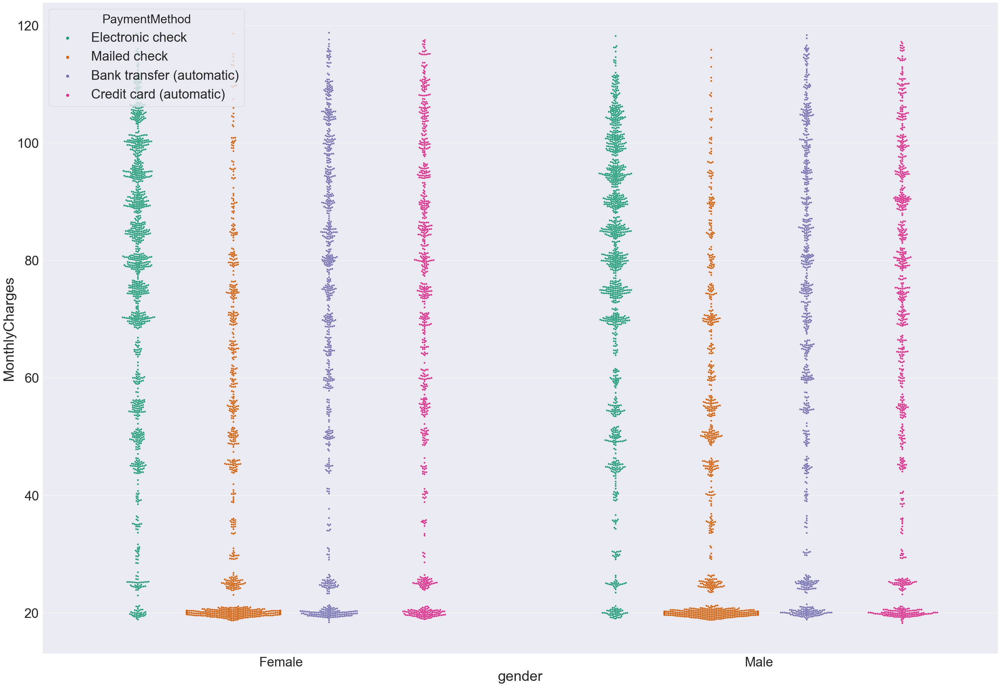

In [89]:
sns.swarmplot( x = "gender" , y = "MonthlyCharges" , data = df ,hue = "PaymentMethod" ,  palette="Dark2" , dodge=True)
plt.title("Swarm Plot of gender and MonthlyCharges Based on PaymentMethod ")

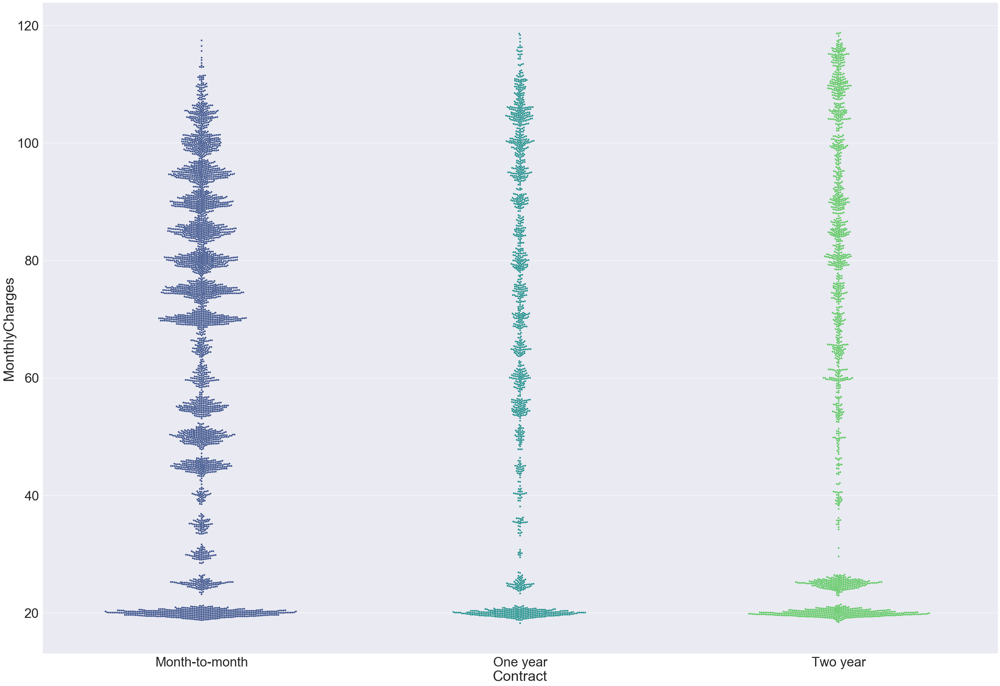

In [90]:
sns.swarmplot( x = "Contract" , y = "MonthlyCharges" , data = df ,  palette="viridis" )
plt.title("Swarm Plot of Contract and MonthlyCharges  ")

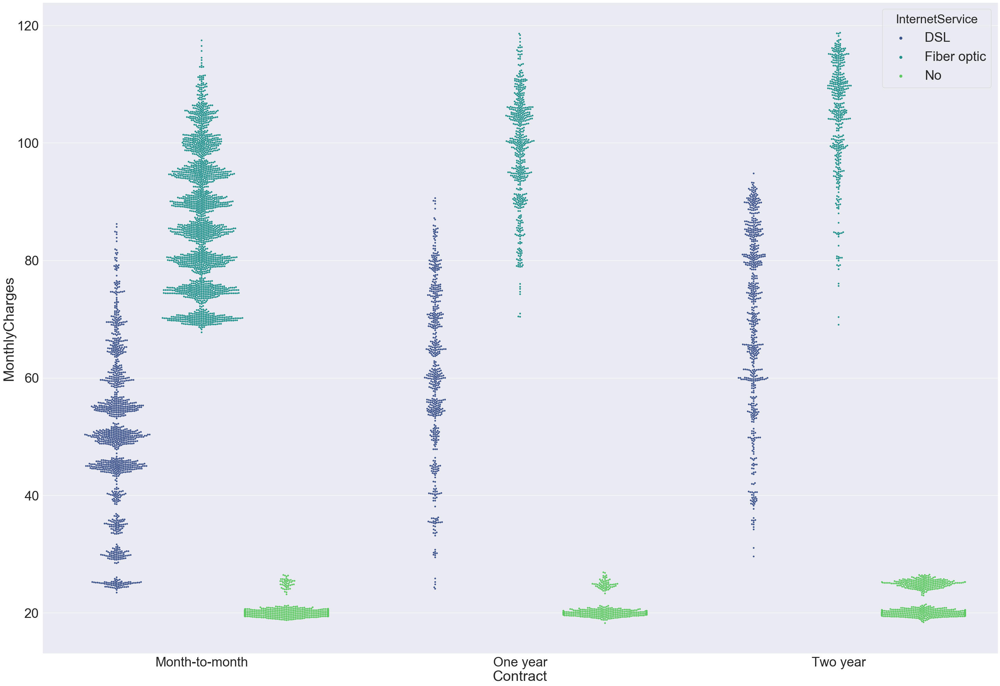

In [91]:
sns.swarmplot( x = "Contract" , y = "MonthlyCharges" , data = df ,hue = "InternetService" ,  palette="viridis" , dodge=True)
plt.title("Swarm Plot of Contract and MonthlyCharges Based on InternetService ")

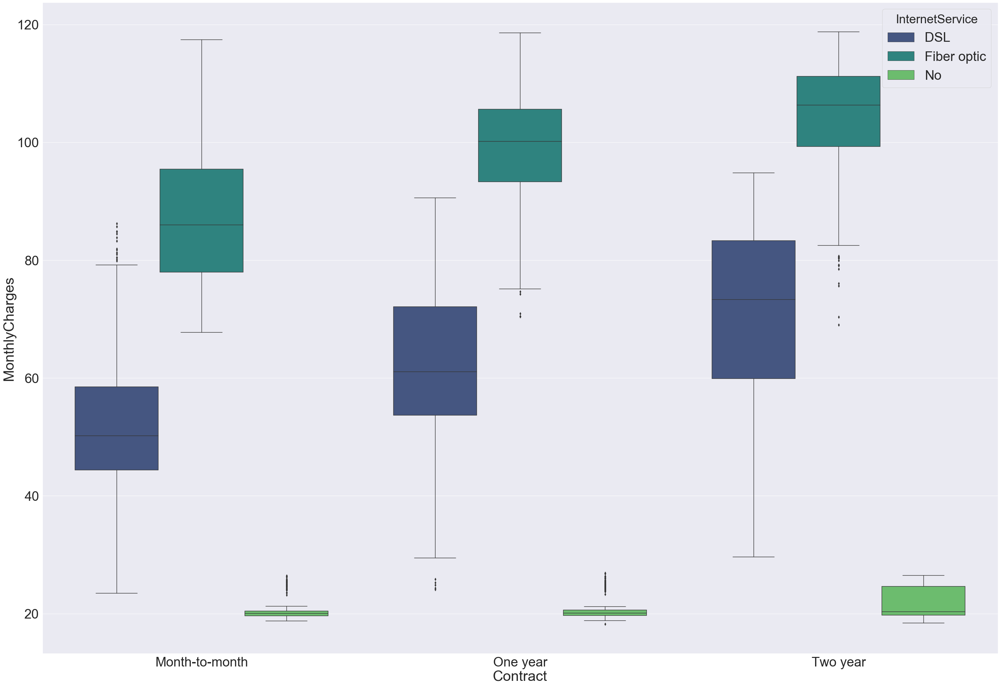

In [92]:
sns.boxplot( x = "Contract" , y = "MonthlyCharges" , data = df ,hue = "InternetService" ,  palette="viridis" , dodge=True)
plt.title("Box Plot of Contract and MonthlyCharges Based on InternetService ")

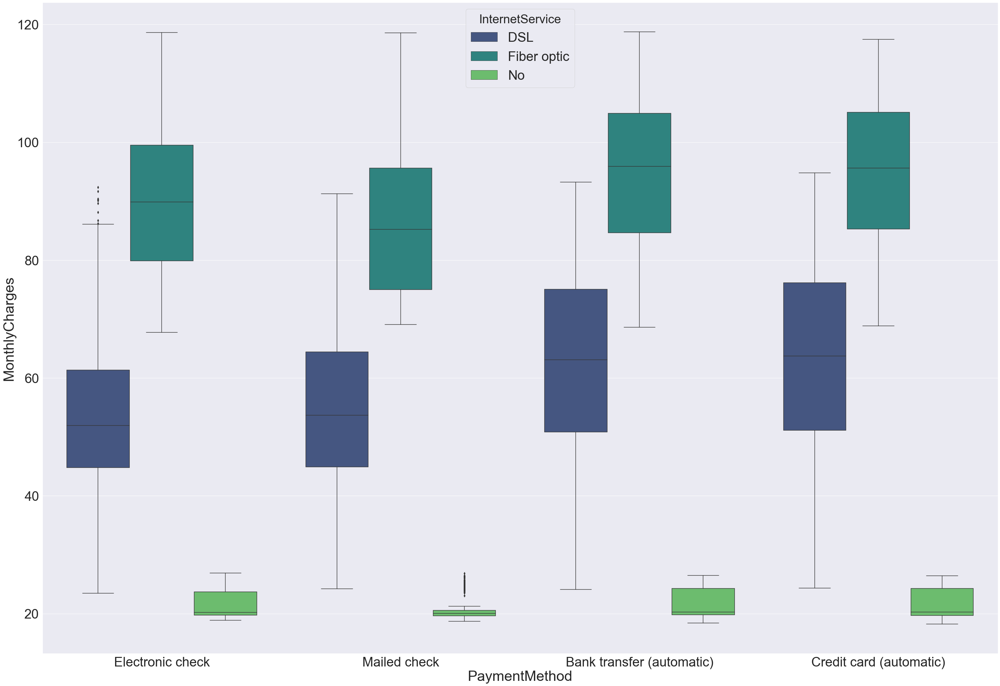

In [93]:
sns.boxplot( x = "PaymentMethod" , y = "MonthlyCharges" , data = df ,hue = "InternetService" ,  palette="viridis" , dodge=True)
plt.title("Swarm Plot of PaymentMethod and MonthlyCharges Based on InternetService ")

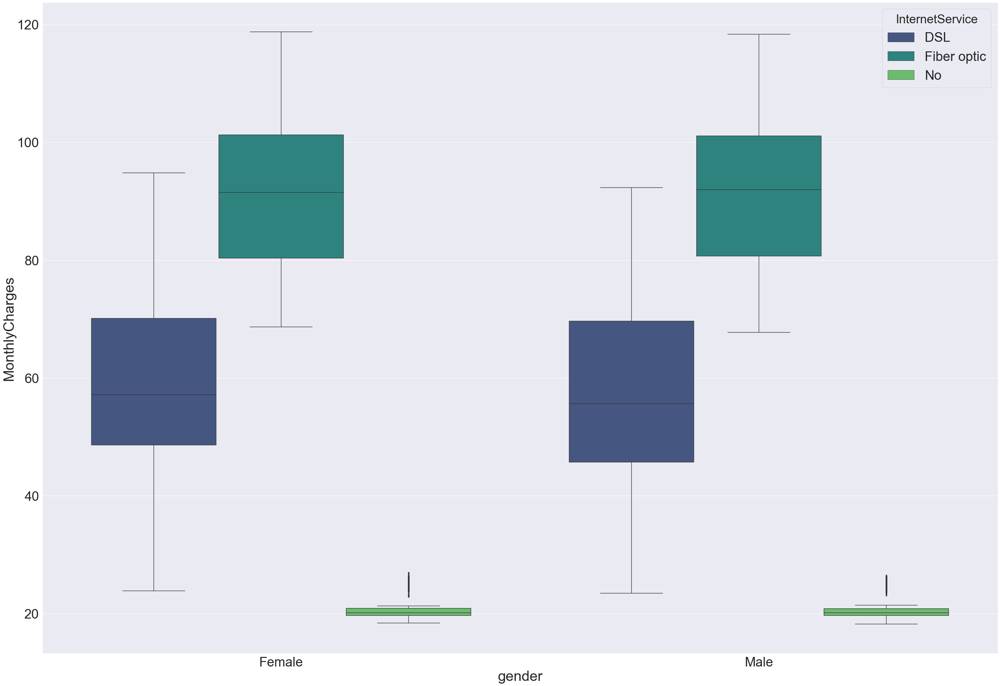

In [94]:
sns.boxplot( x = "gender" , y = "MonthlyCharges" , data = df ,hue = "InternetService" ,  palette="viridis" , dodge=True)
plt.title("Box Plot of gender and MonthlyCharges Based on InternetService ")

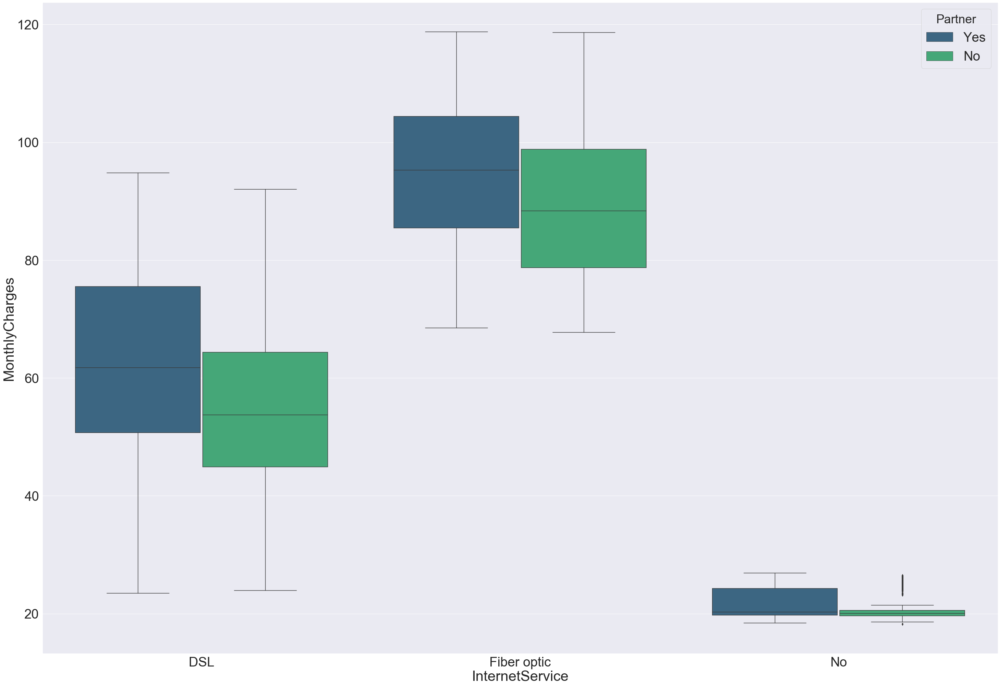

In [95]:
sns.boxplot( x = "InternetService" , y = "MonthlyCharges" , data = df ,hue = "Partner" ,  palette="viridis" , dodge=True)
plt.title("Box Plot of InternetService and MonthlyCharges Based on Partner ")

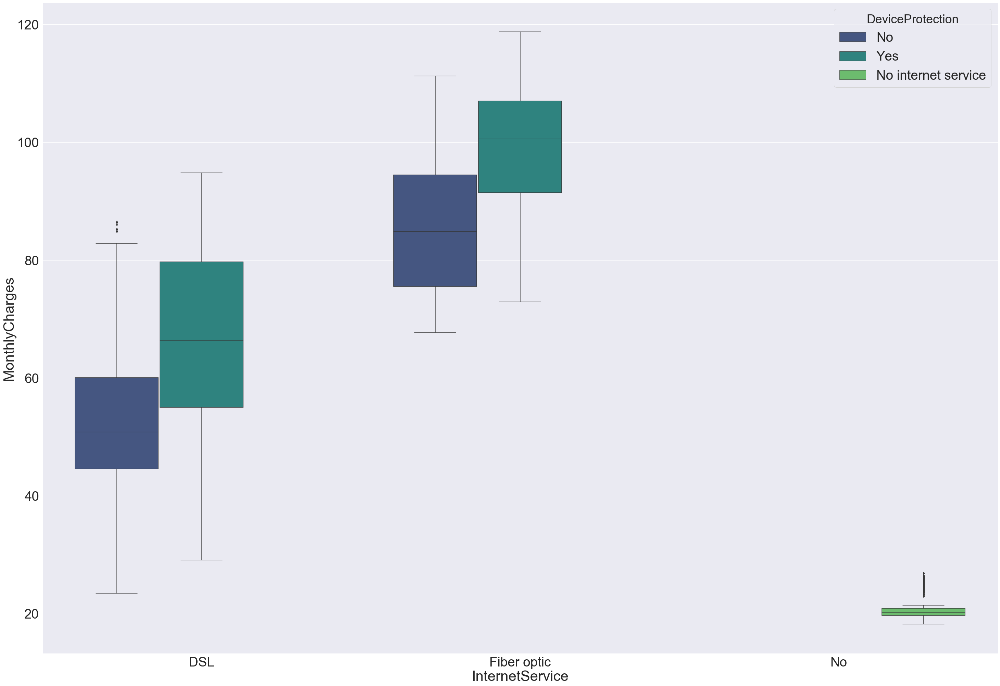

In [96]:
sns.boxplot( x = "InternetService" , y = "MonthlyCharges" , data = df ,hue = "DeviceProtection" ,  palette="viridis" , dodge=True)
plt.title("Box Plot of InternetService and MonthlyCharges Based on DeviceProtection ")

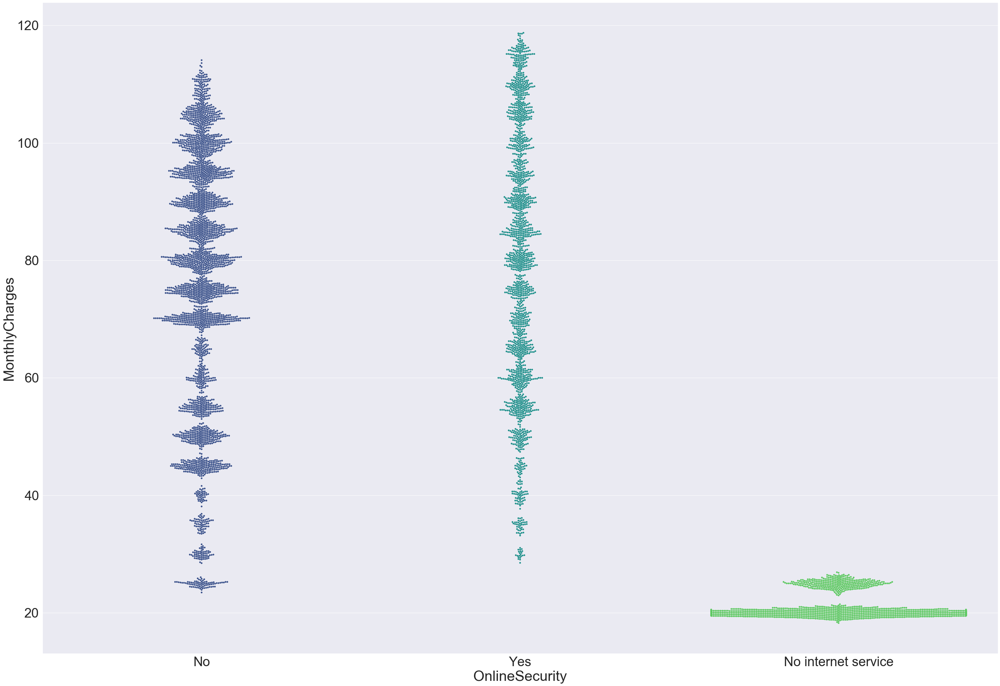

In [97]:
sns.swarmplot( x = "OnlineSecurity" , y = "MonthlyCharges" , data = df  ,  palette="viridis" )
plt.title("Swarm Plot of OnlineSecurity and MonthlyCharges  ")

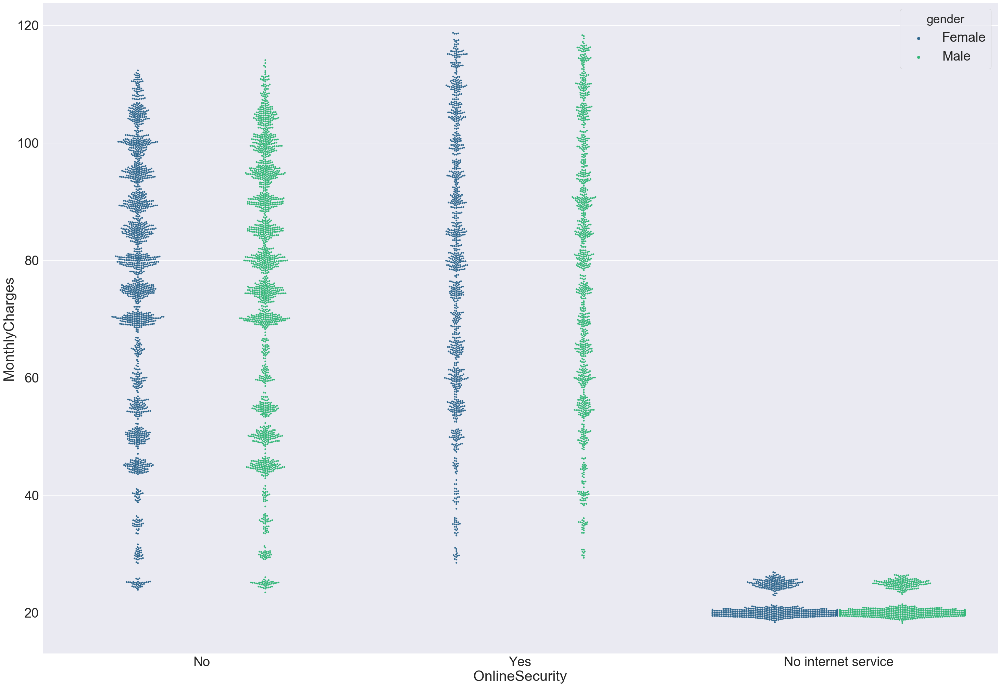

In [98]:
sns.swarmplot( x = "OnlineSecurity" , y = "MonthlyCharges" , data = df  ,  palette="viridis" , hue="gender" , dodge= True)
plt.title("Swarm Plot of OnlineSecurity and MonthlyCharges Based on gender ")

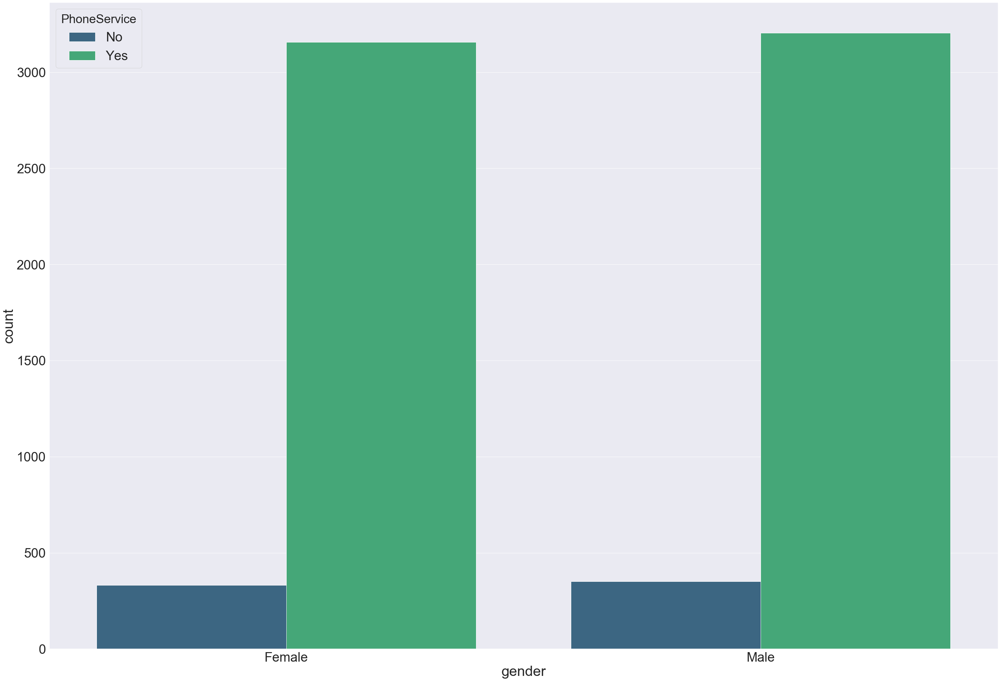

In [99]:
sns.countplot( x = "gender"  , data = df , hue="PhoneService" , palette="viridis")
plt.title("Count Plot of gender Based on PhoneService ")

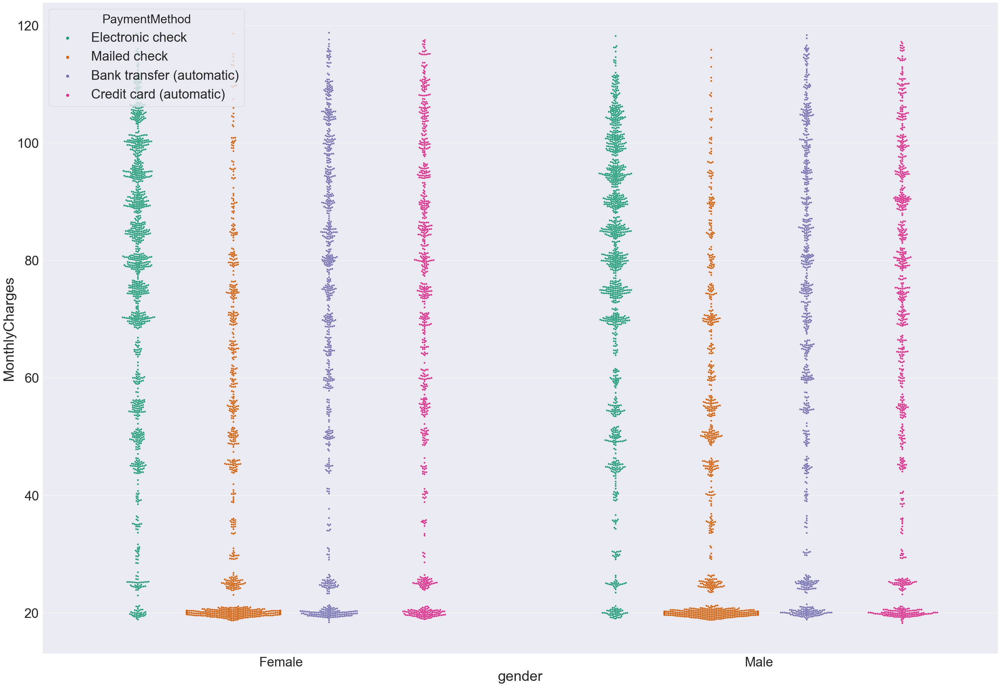

In [100]:
sns.swarmplot( x = "gender" , y = "MonthlyCharges" , data = df ,hue = "PaymentMethod" ,  palette="Dark2" , dodge=True)
plt.title("Swarm Plot of gender and MonthlyCharges Based on PaymentMethod ")

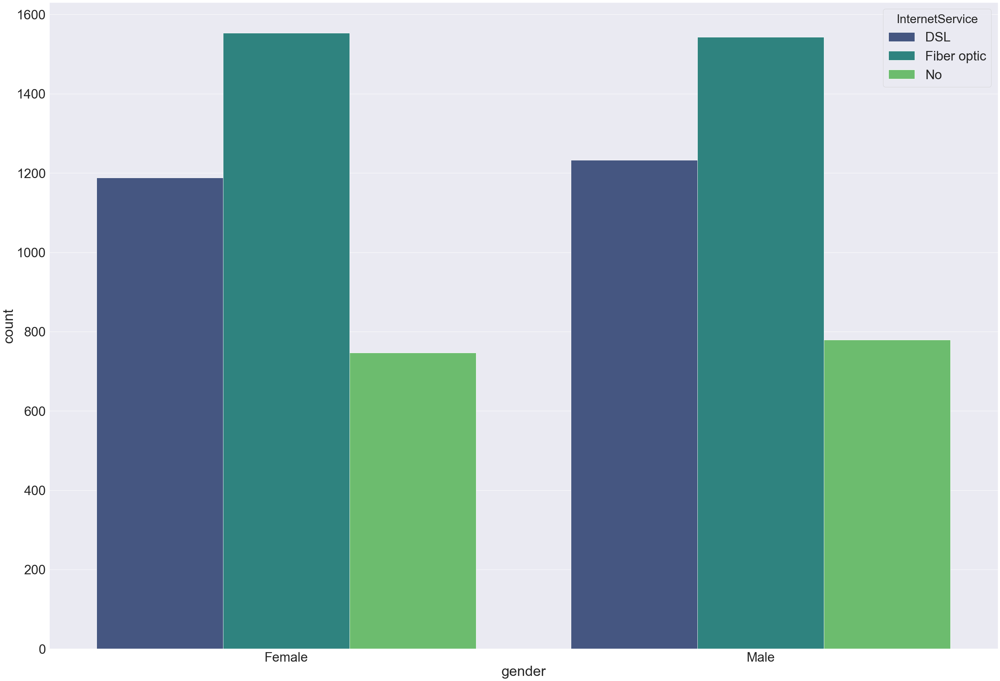

In [101]:
sns.countplot( x = "gender"  , data = df , hue="InternetService" , palette="viridis")
plt.title("Count Plot of gender  Based on InternetService ")

* From the Result above we can See that ::
    * Males and Females Clients Who use Fiber_optic are Hue .
    * Males and Femals clients who use DSL are less few.
    * Males and Females clients who o use That services are more less.

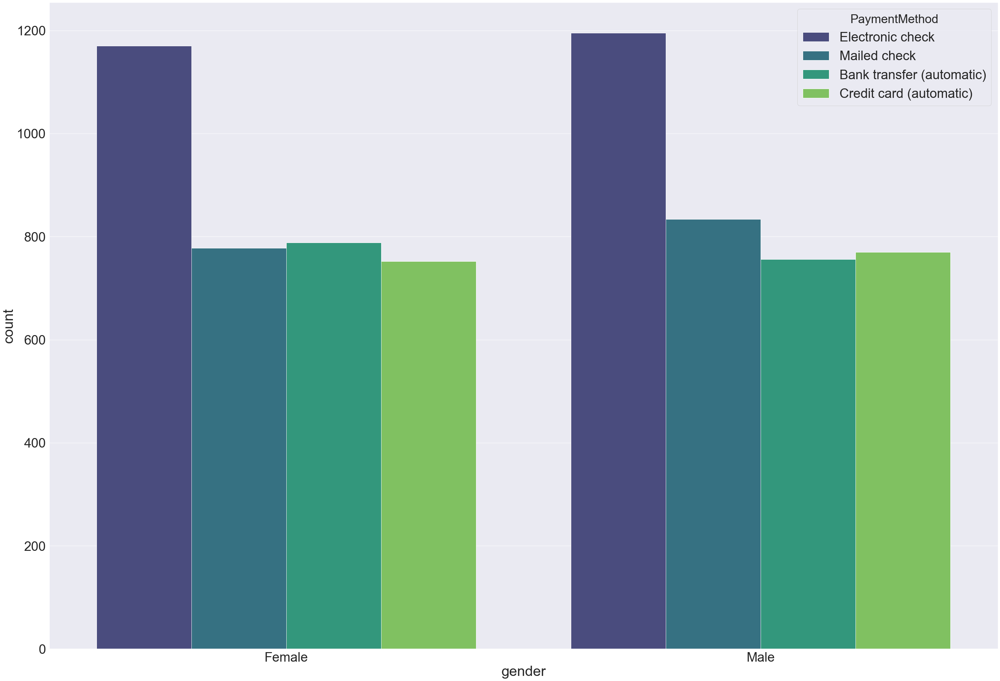

In [102]:
sns.countplot( x = "gender"  , data = df , hue="PaymentMethod" , palette="viridis")
plt.title("Count Plot of gender  Based on PaymentMethod ")

* From the result above we can see that ::
    * Males and Females Clients are use Electronic Check as Payment_Method.
    * On Males ::
        * Numbers of clients who use Malied_Check less few.
        * Numbers of Clients who use Credit_cared and Bank_transfer Less few compare With ohter Methods.
    * On Females ::
        * Numbers of Clients who use Malied_Check and Bank_transfer Less few.
        * Numbers of clients who use Credit_cared less few compare with other Methods.
        

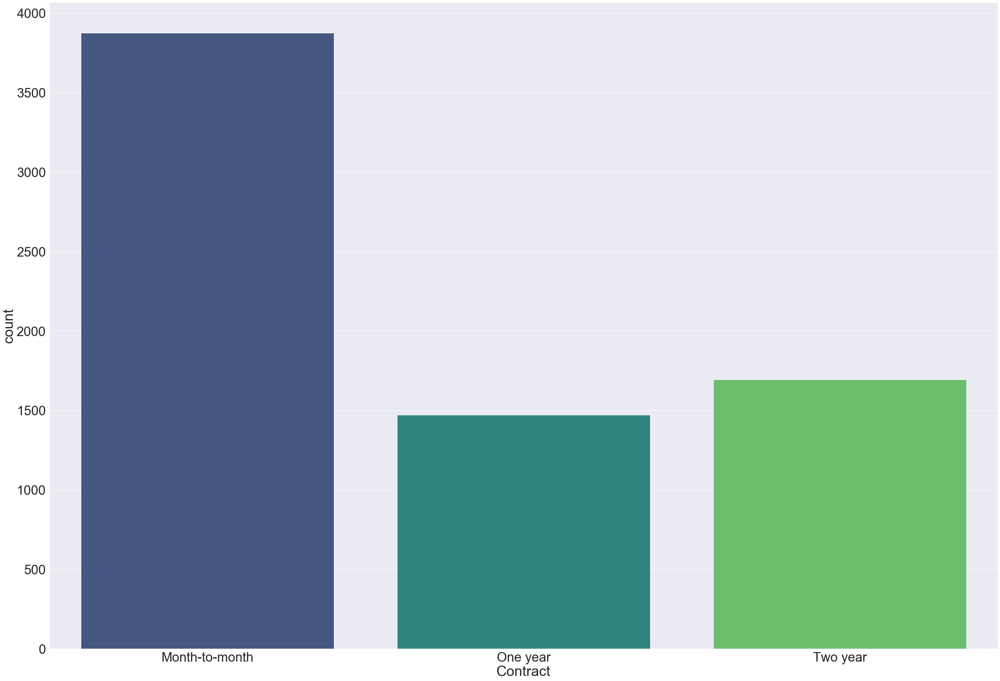

In [103]:
sns.countplot( x = "Contract"  , data = df  , palette="viridis")
plt.title("Count Plot of Contract ")

* From The Result above we can see That :: 
    * Count of Clients are use Moth_to_Month contract are Largest Comparing Other Contracts as (3500).
    * Count of Clients are use Two_year and One_year are Less comparing With Month_To_Month as (1400).

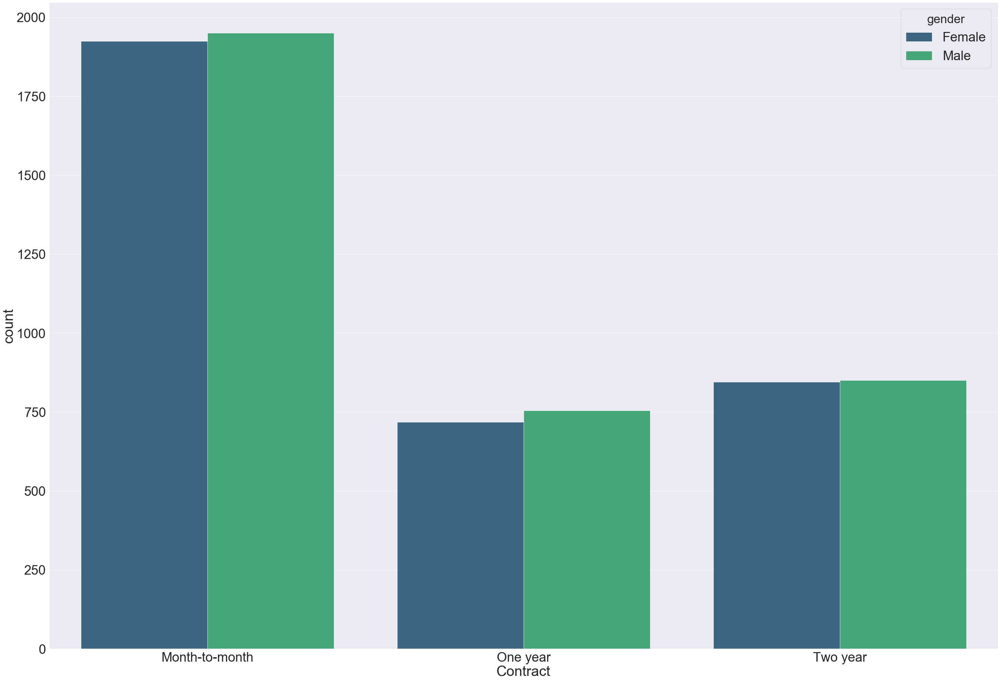

In [104]:
sns.countplot( x = "Contract"  , data = df ,hue="gender" , palette="viridis")
plt.title("Count Plot of Contract  Based on gender ")

* From the result above we can see that ::
    * Males Clients ::
        * Count of user Who Use Month_To_Month Contract  are Laregest comparing with other Methods.
        * Count of User who use One_Year and Two_year are less Comparing with other Methods.
    * Females Clients ::
        * Count of user Who Use Month_To_Month Contract  are Laregest comparing with other Methods.
        * Count of User who use One_Year and Two_year are less Comparing with other Methods.

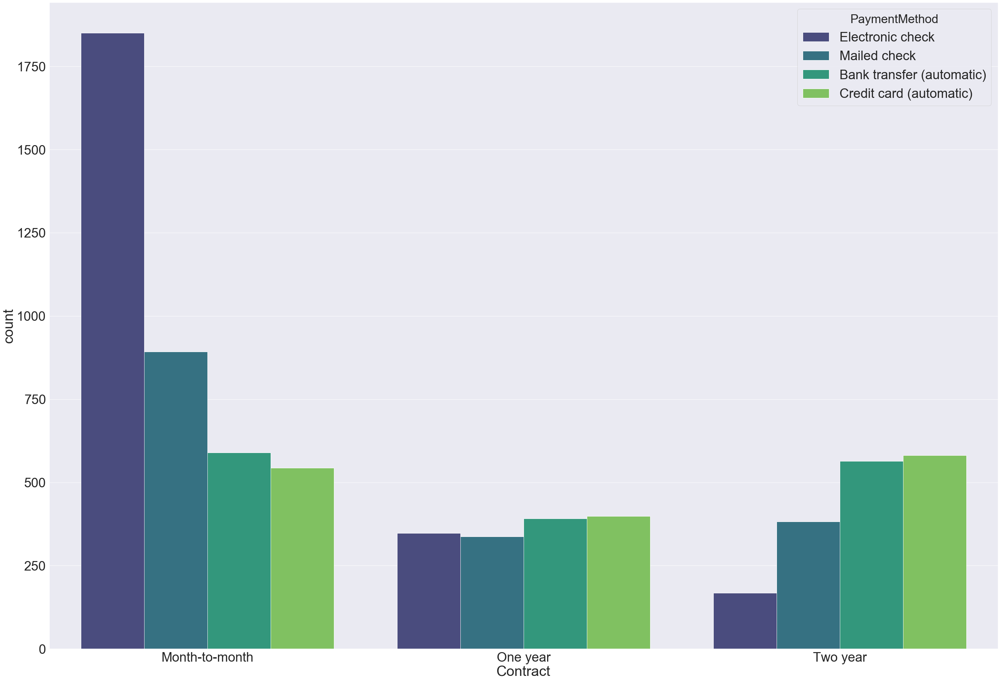

In [105]:
sns.countplot( x = "Contract"  , data = df ,hue="PaymentMethod" , palette="viridis")
plt.title("Count Plot of Contract  Based on PaymentMethod ")

* From The Result above we can see that ::
    * Clients use Month_To_Month Contract ::
        * Count Of Clients who use Electronic_Check are large Comparing with other Pay_Methods.
        * Count of Clients Who use Malid_Check method are less few comparing With Electronic Method.
        * Count of Clients who use Bank_transfer are less Comparing with Electronic and Malid Methods.
        * Count of Clients who use Credit_Card Method are More less Method Coparing with other payment Methods.
    * Clients use One_Year Contract ::
        * Count Of Clients who use That methods are less few Comparing With Other Contract.
        
    * Clients use Two _year Contracts ::
        * Count of users who use Credit card method is large Comparing With other Methods.
        * Count Of users who use Bank_transfer are less few comparing with Credit_card_method.
        * Count of users who use Malid_Method are less few comparing with credit and Bank Methods.
        * Count of users who use Electronic Method are More Less Comparing With Other Payment Method.

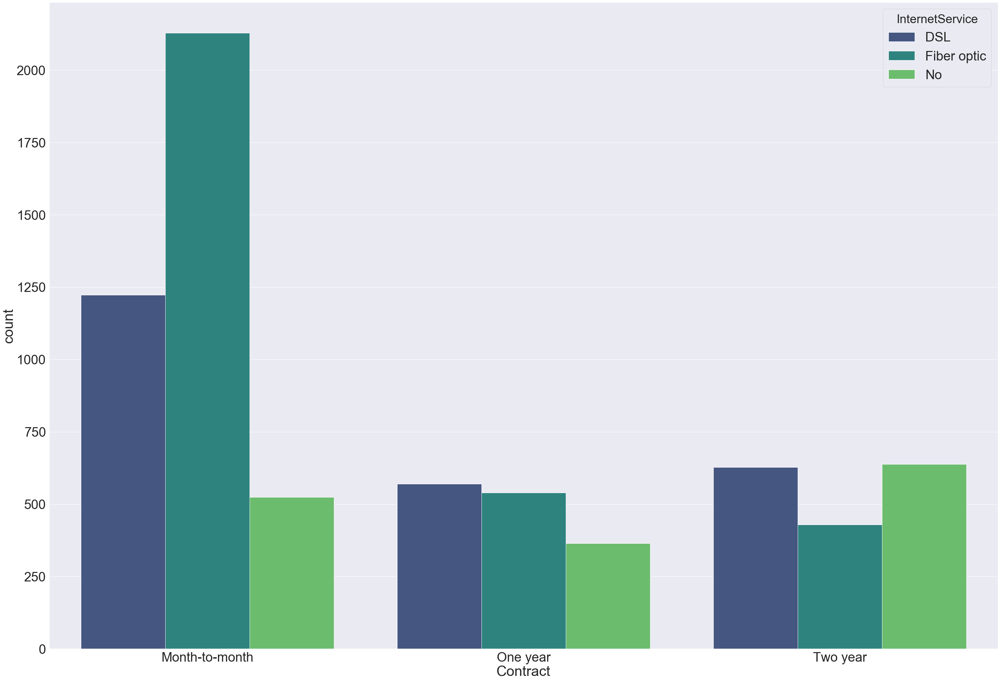

In [106]:
sns.countplot( x = "Contract"  , data = df ,hue="InternetService" , palette="viridis")
plt.title("Count Plot of Contract  Based on InternetService ")

* From The result above we can see that ::
    * Clients who use Month_To_Month Contract ::
        * Count Of Clients who use Fiber_optic Services are More Largest .
        * Count of Clients who use DSL services are less few Comparing with Fiber_Optic Services.
        * Count of Clients who Not Use That Services are More Less Comparing with Other Services.
        
    * Clients Who use One_year Contract ::
        * Count Of Clients who use DSL are Largest.
        * Count of Clients who use Fiber_Optic services are less few comparing with DSL lients count.
        * Count of Clients who Not Use That Services are less Comparng with Clents who use other services.
    
    * Clients who use Two_years Contract ::
        * Count Of Clients who Not use That Services Services are More Largest .
        * Count of Clients who use DSL services are less few Comparing with not use that  Services.
        * Count of Clients who Use Fiber_optic  Services are More Less Comparing with Other Services.

In [107]:
df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

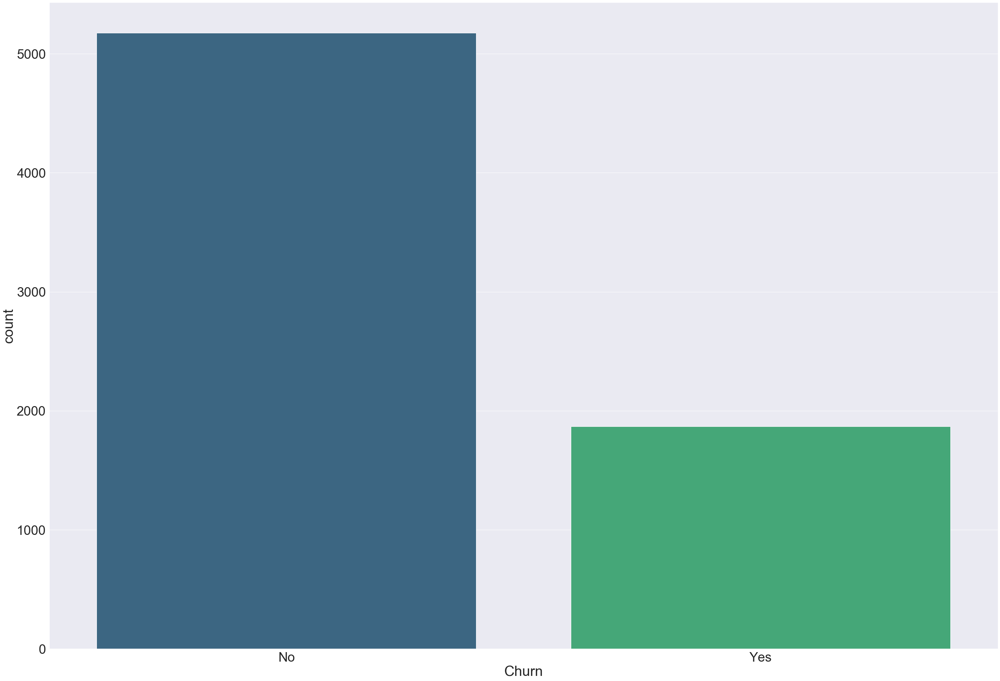

In [108]:
sns.countplot( x = "Churn"  , data = df  , palette="viridis")
plt.title("Count Plot of Churn")

* From The result above we can see That ::
    * Count Of No Churn Clients are more Lar than The Count Of Churn Clients.

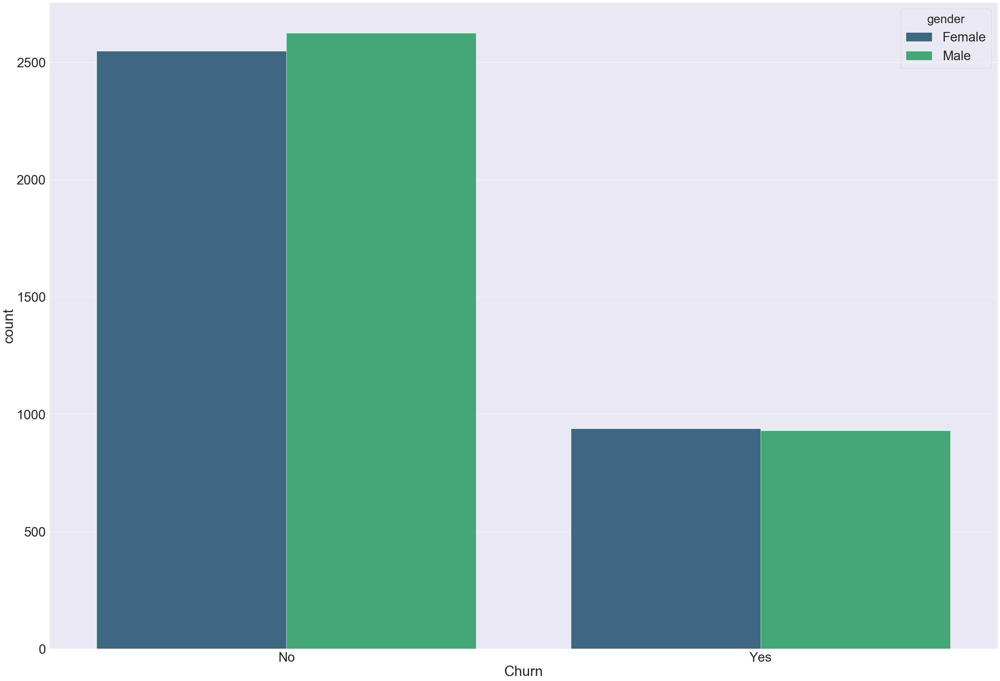

In [109]:
sns.countplot( x = "Churn"  , data = df  , palette="viridis" , hue="gender")
plt.title("Count Plot of Churn  Based on gender ")

* From the result above we can see that::
    * Count of Males and Femals Clients similariy onthe Case of No Churn.
    * Count of Males and Femals Clients similariy onthe Case of yes Churn.
        

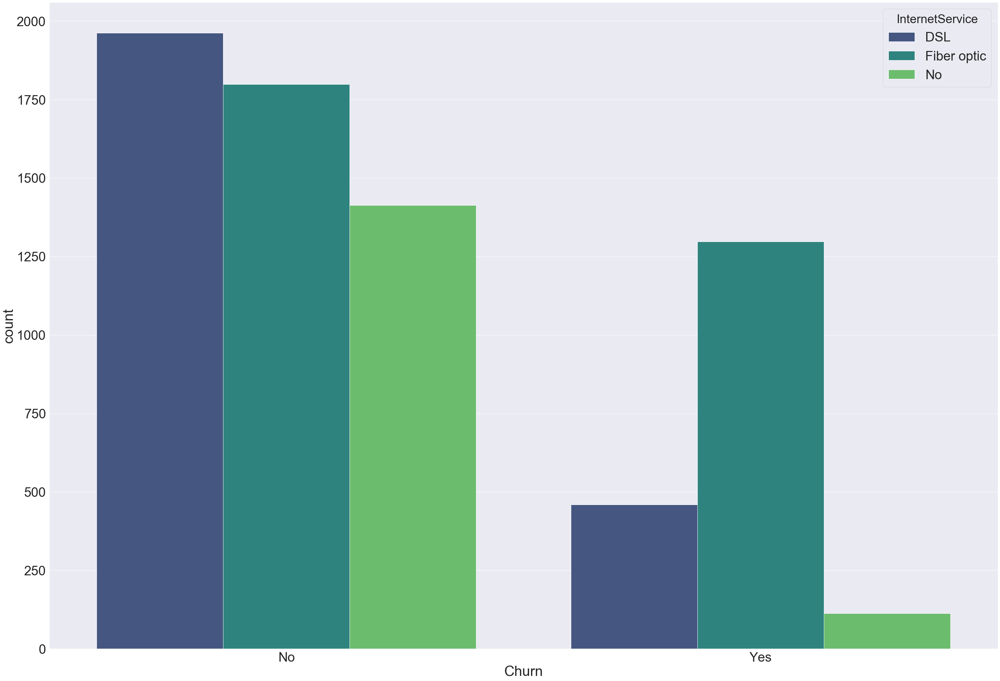

In [110]:
sns.countplot( x = "Churn"  , data = df  , palette="viridis" , hue="InternetService")
plt.title("Count Plot of Churn  Based on InternetService ")

* From the result above we can see ::
    * On The No Churn Case ::
        * The Count of Clients who use DSL interet_Services Is Largest.
        * The Count of clients who use Fiber_optic is less few comparing with DSL Case.
        * The Count of Clients Who NoUse Internet_Services Less than other Cases.
    * On yes Churn case ::
        * The Count of Clients who use Fiber_optic is the Largest.
        * The Count of Clients who use DSL is more less comparing with iber case.
        * The Count of Clients Who No Use internet sevices are More less Comparing with other cases.

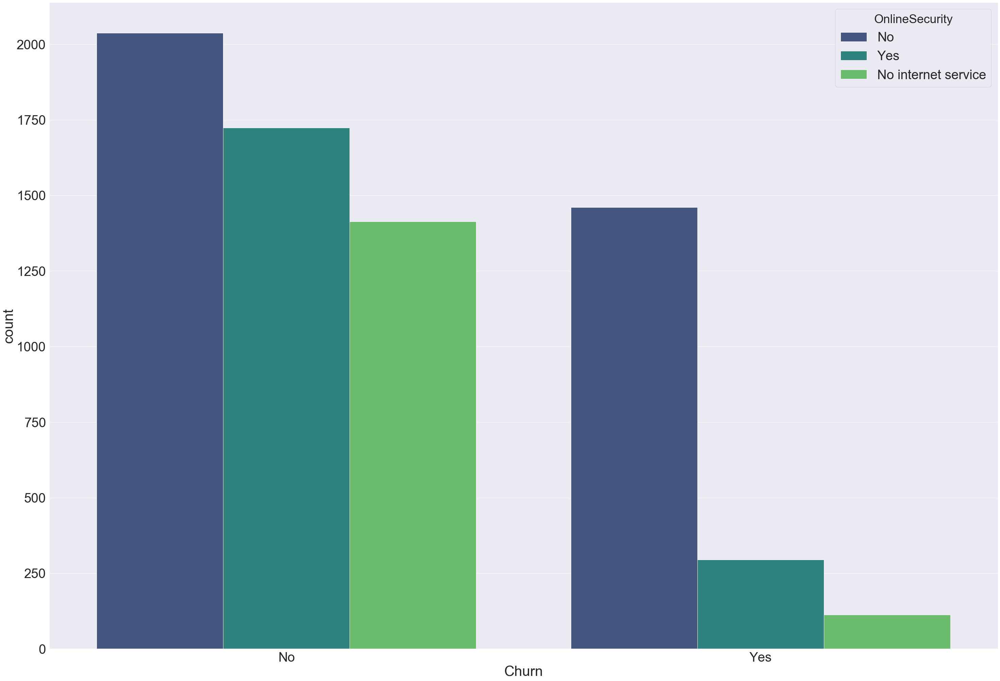

In [111]:
sns.countplot( x = "Churn"  , data = df  , palette="viridis" , hue="OnlineSecurity")
plt.title("Count Plot of Churn  Based on OnlineSecurity ")

* From The result above we can see ::
    * On The No Churn Case ::
        * Count of Clients who No use Online_Security Servises is largest.
        * Count of Clients who use Online_Security Services is less few Comparing with No Use That Services.
        * Count of Clients who No Use Internet Sevices Is The Least Comparing With Other Cases.
    * On The Yes Churn ::
        * Count of clients who No Use Online_Security Services is The Largest.
        * Count of Clients who use Online_Security Services are more less than NO use case.
        * Count of Clients Who Not use Internet Services More less Comparing with other cases.

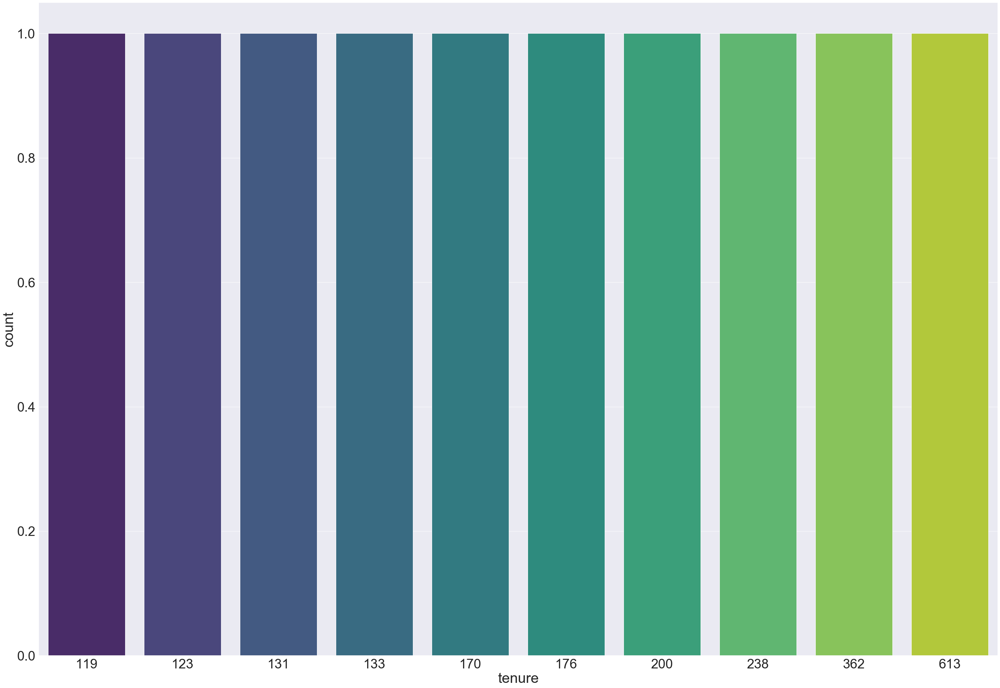

In [112]:
tenure = df["tenure"].value_counts()[:10]
sns.countplot( x = tenure  , data = df  , palette="viridis" )
plt.title("Count Plot of tenure")

* From the result above we can see that ::
    * The count of tenure is largest in (111).
    * The count of tenure is less than other in all other tenure.

Text(0.5, 1.0, 'The Count of Partner Clients is_Married or not_Married')

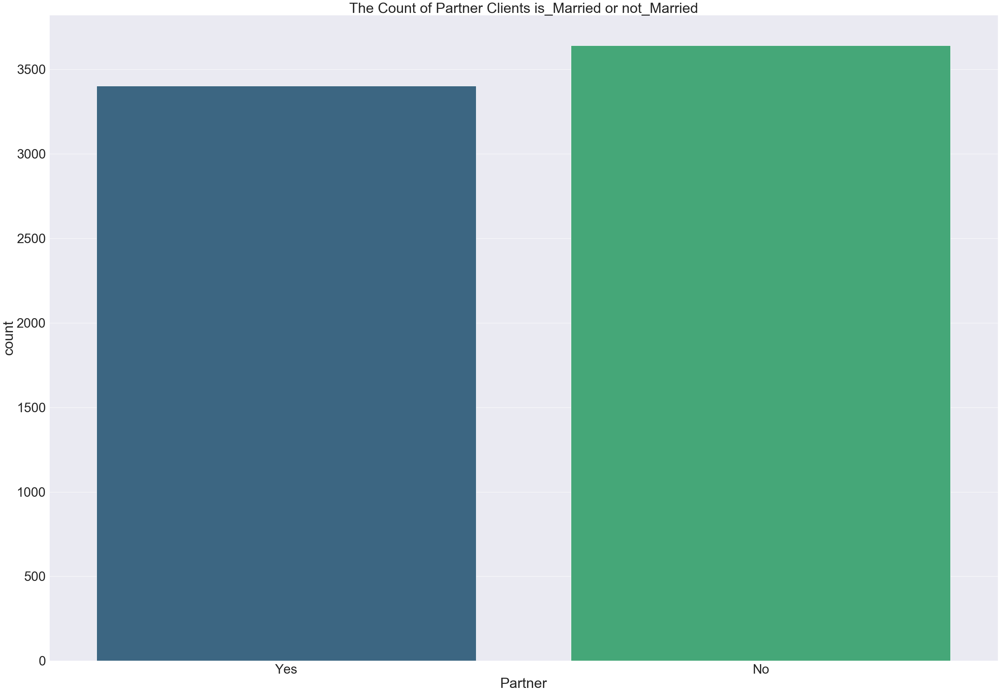

In [113]:
sns.countplot( x = "Partner"  , data = df  , palette="viridis" )
plt.title("The Count of Partner Clients is_Married or not_Married")

* From the result above we ca see that ::
    * Count Of No partners are lergest than yes partners.

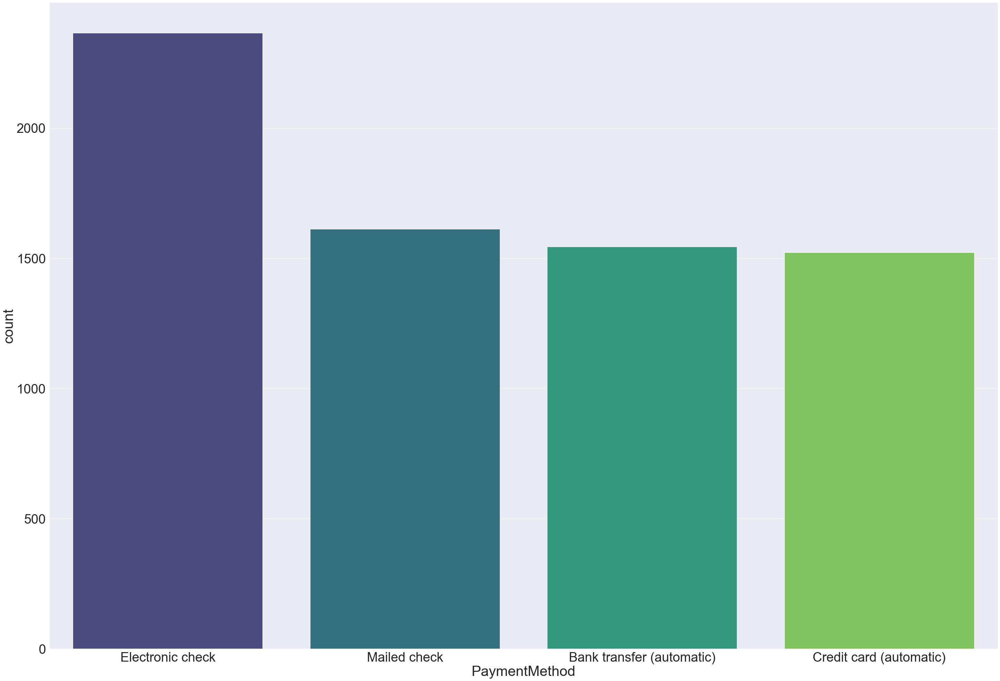

In [114]:
sns.countplot( x = "PaymentMethod"  , data = df  , palette="viridis" )
plt.title("Count Plot of PaymentMethod")


(array([0, 1, 2, 3]), <a list of 4 Text xticklabel objects>)

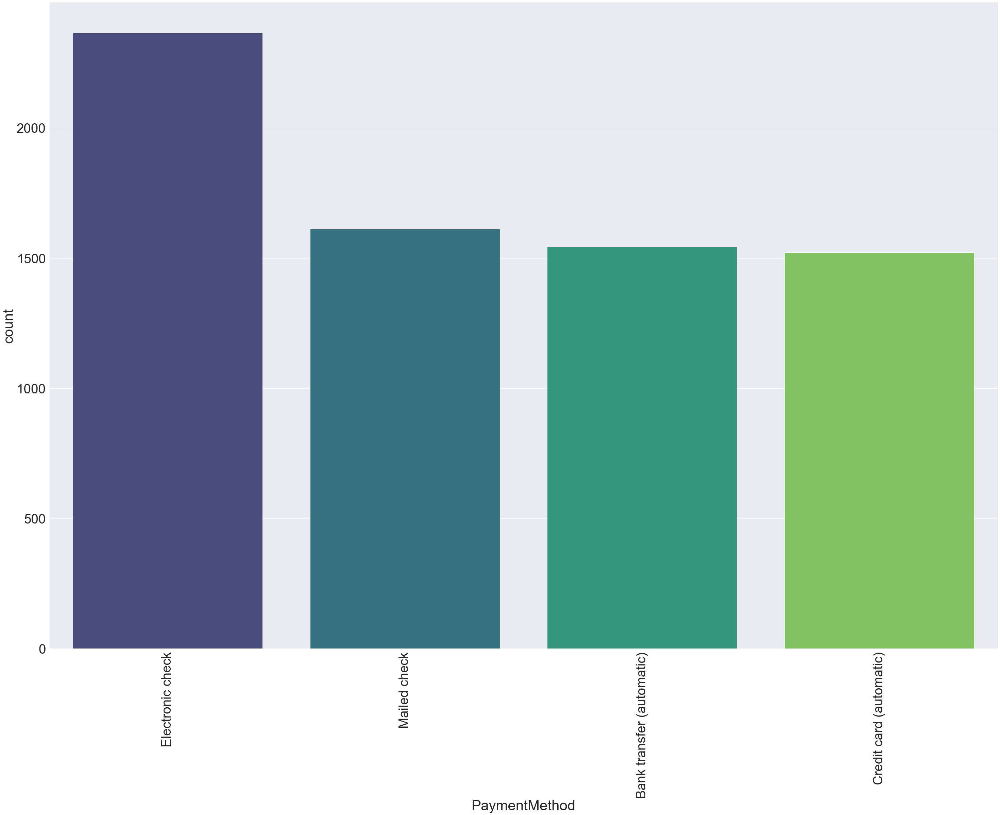

In [115]:
sns.countplot( x = "PaymentMethod"  , data = df  , palette="viridis" )
plt.xticks(rotation = 90)
plt.title("Count Plot of PaymentMethod")


(array([0, 1, 2, 3]), <a list of 4 Text xticklabel objects>)

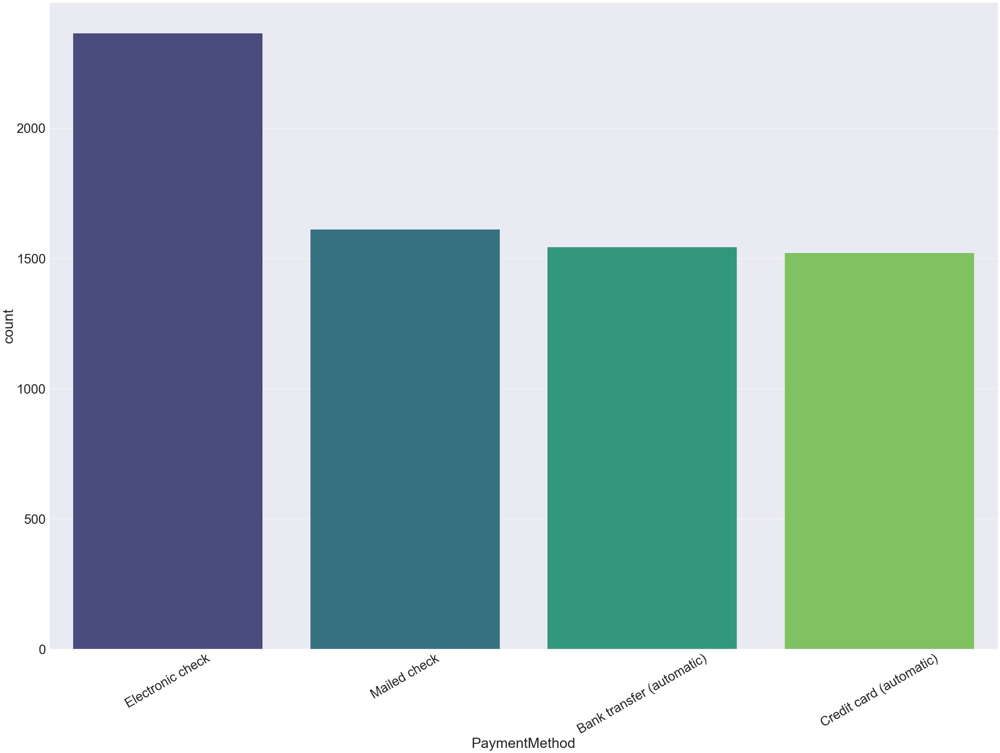

In [116]:
sns.countplot( x = "PaymentMethod"  , data = df  , palette="viridis" )
plt.xticks(rotation = 30)


* From The result above we can see that ::
    * Count Of Clients use Elecronic Payment  Method are Largest.
    * Count Of Clients who use Malid Payment Method  are less few comparing with Electronic Meyhod
    * Count Of Clients who use Credit-ard and Bank-transfer are the leest .

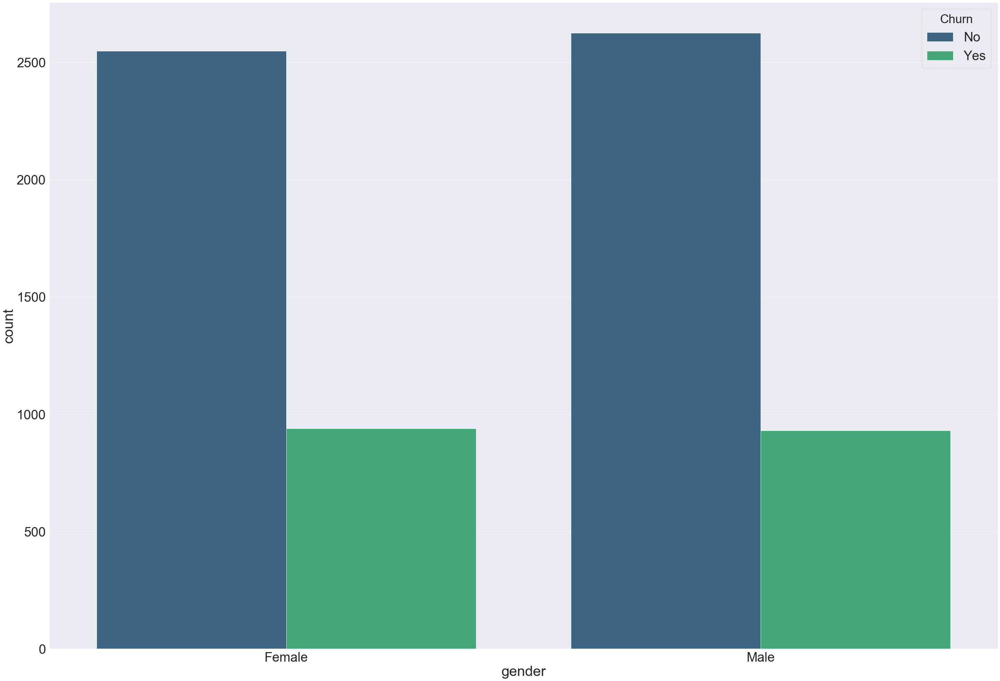

In [117]:
sns.countplot(x = "gender" , data = df , hue="Churn", palette="viridis")
plt.title("Count Plot of gender  Based on Churn ")


* From the result above we can see That ::
    * count of No churn are More hue in the gender of ( Female = 2500 , Male = 2700 ).
    * count of yes churn are less comparing with other cases in the gender of (Female , Male = 900).

(array([0, 1, 2, 3]), <a list of 4 Text xticklabel objects>)

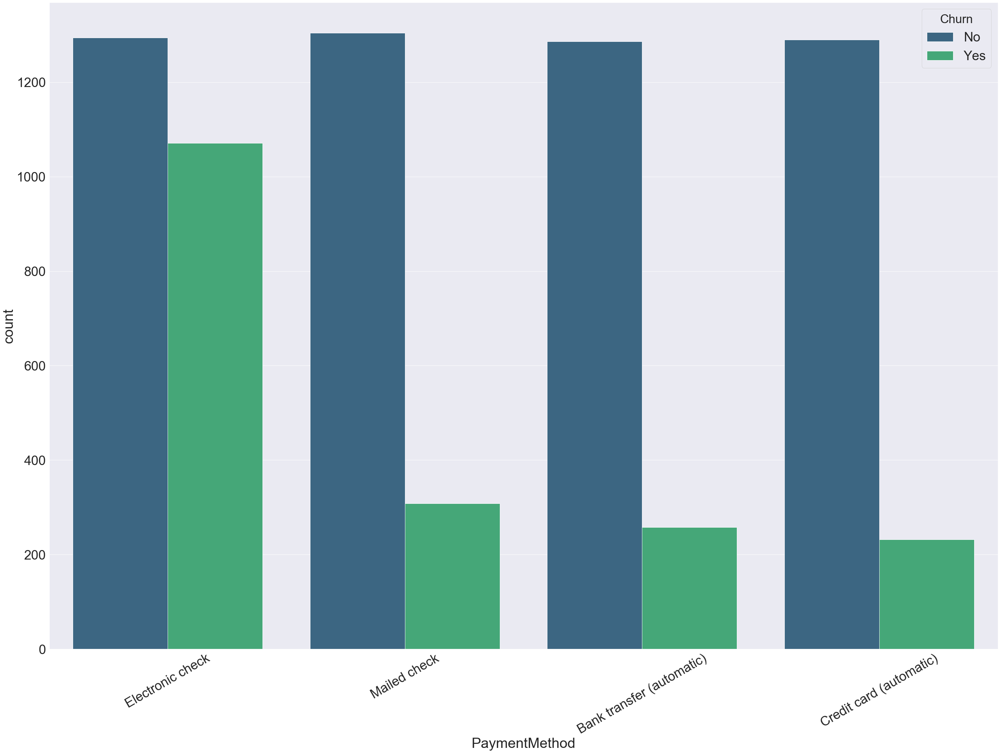

In [118]:
sns.countplot(x = "PaymentMethod" , data = df , hue = "Churn" , palette="viridis")
plt.xticks(rotation = 30)
plt.title("Count Plot of PaymentMethod  Based on Churn ")


* From the result above we can see that ::
    * On No_Churn Case ::
        * All Payment_Methods count are more large (1500) count.
    * On Yes_Churn Case ::
        * All Payment method count are less more Comparing To No_Churn Case (300) count.
        * But on The Electronic_Method count of Yes_Churn are large 

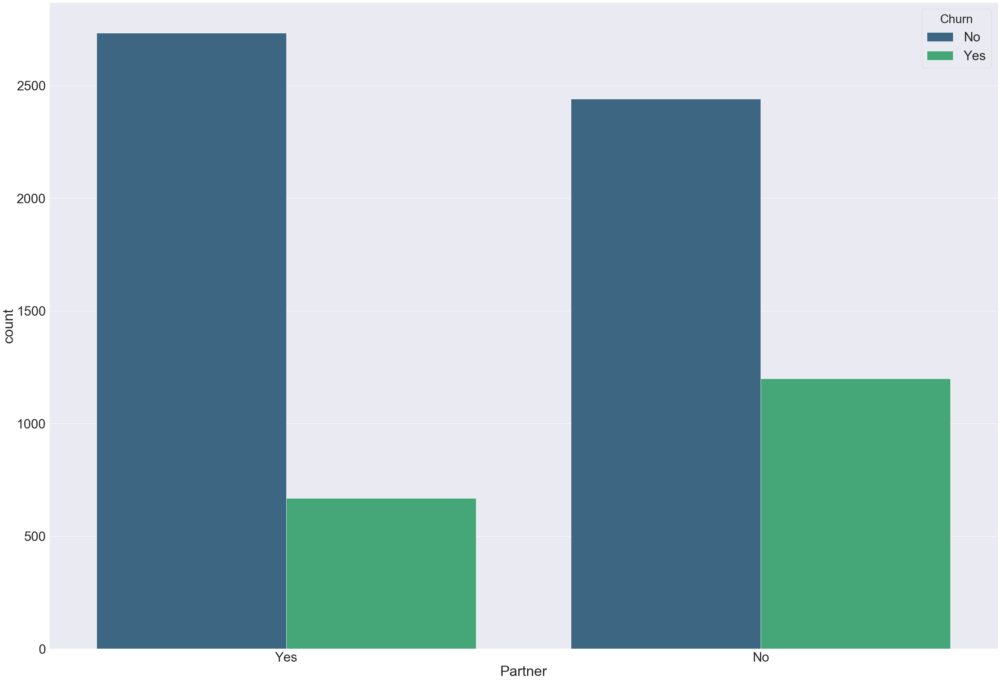

In [119]:
sns.countplot(x = "Partner" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of Partner  Based on Churn ")


* From the result above we can see That ::
    * On No_Churn Case ::
        * The Count of Clients Who Married More Large .
        * The Count of Clients Who NO_Married More  Large.
    * On Yes_Churn Case ::
        * The Count of Clients Who Married More less .
        * The Count of Clients Who NO_Married More less.

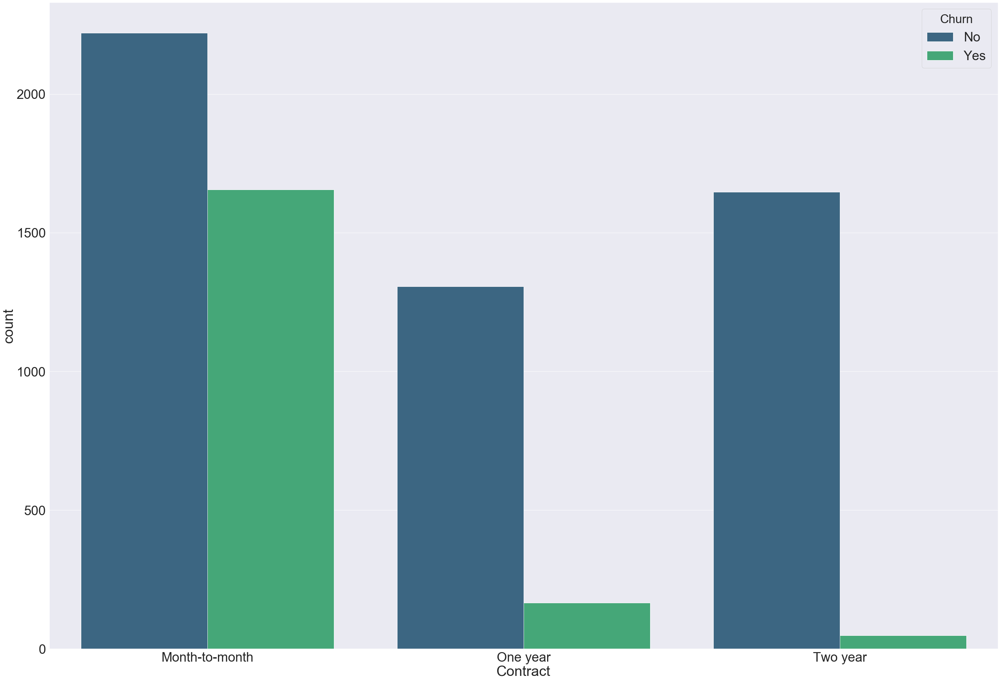

In [120]:
sns.countplot(x = "Contract" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of Contract  Based on Churn ")


* From the result above we can see That ::
    * On No_Churn Case ::
        * The Count of Clients Who its contract Month_To_Month More Large.
        * The Count of Clients Who its contract One_year More  Large.
        * The Count of Clients Who its contract TWo_year More  Large.
    * On Yes_Churn Case ::
        * The Count of Clients Who its contract Month_To_Month less few.
        * The Count of Clients Who its contract One_year More Less.
        * The Count of Clients Who its contract TWo_year More Less.
        

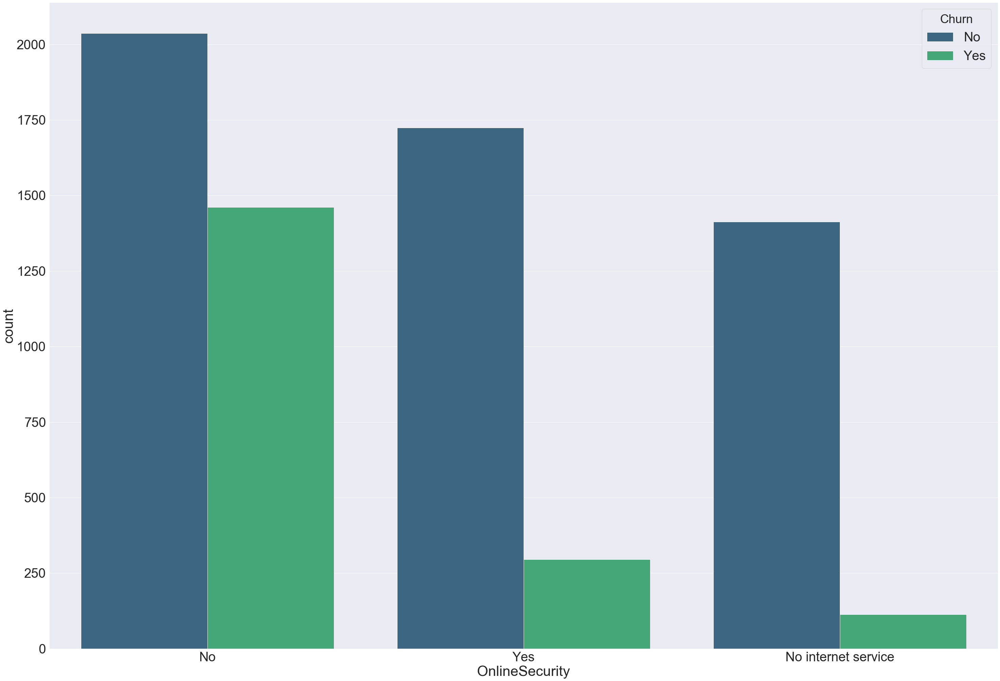

In [121]:
sns.countplot(x = "OnlineSecurity" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of OnlineSecurity  Based on Churn ")


* From the result above we can see That ::
    * On No_Churn Case ::
        * The Count of Clients Who its contract No_OnlineSecurity More Large.
        * The Count of Clients Who its contract Yes_OnlineSecurity More  Large.
        * The Count of Clients Who its contract No_Internet_Services More  Large.
    * On Yes_Churn Case ::
        * The Count of Clients Who its contract No_OnlineSecurity less few.
        * The Count of Clients Who its contract Yes_OnlineSecurity More Less.
        * The Count of Clients Who its contract No_Internet_Services More Less.
        

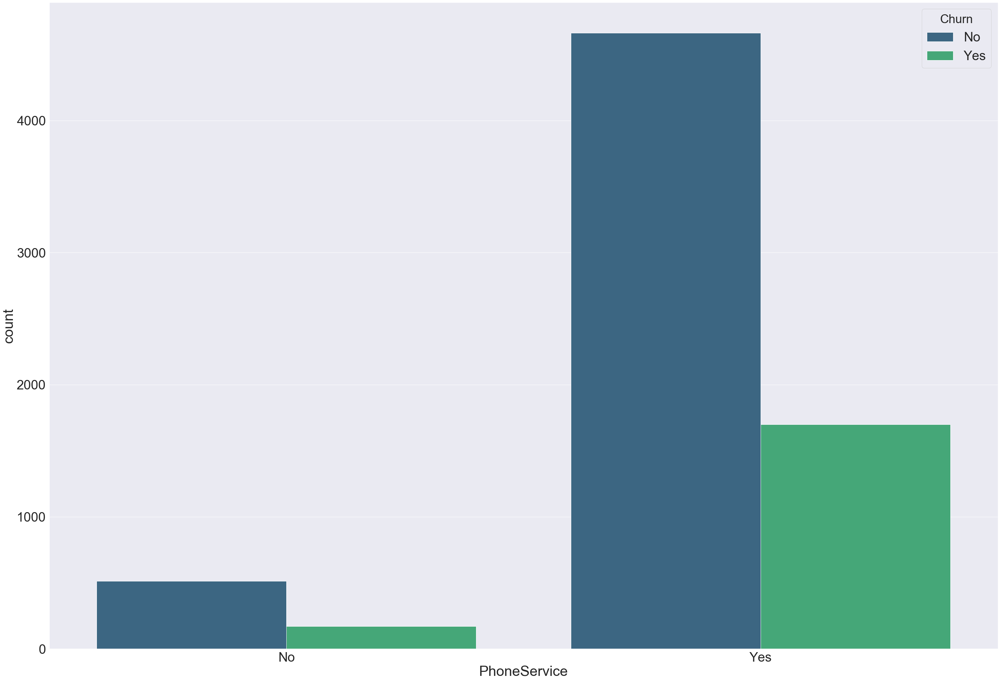

In [122]:
sns.countplot(x = "PhoneService" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of PhoneService  Based on Churn ")


* From The result above we can see That ::
    * On No_Churn Case ::
        * The Count of Clients who No use Phone_Services More Less .
        * The Count of Clients who  Use Phone_Services More Large .
    * On Yes_Churn Case ::
        * The Count of Clients who No use Phone_Services More less Comparing with No Phone_Services.
        * The Count of Clients Who Use Phone_Services  More Less Comparing with No Phone_Services.

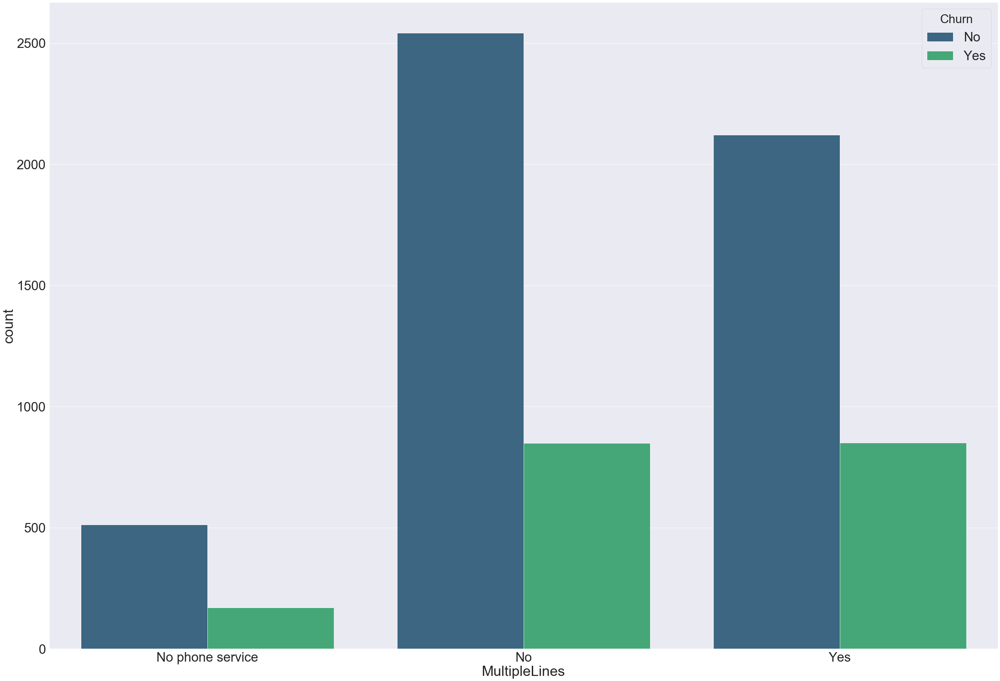

In [123]:
sns.countplot(x = "MultipleLines" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of MultipleLines  Based on Churn ")


* From The result above we can see That ::
    * On The No_Churn Case ::
        * The Count of Clients who  Use , No_Use and No_Phone_services large.
    * On The Yes_Churn Case ::
        * The Count of Clients who  Use , No_Use and No_Phone_services Less.

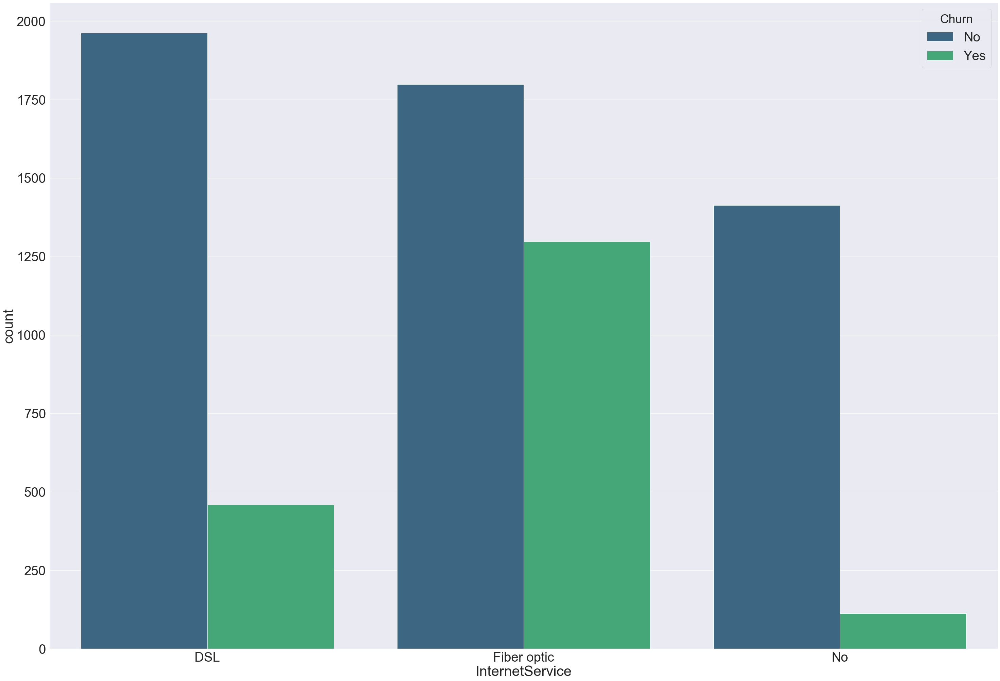

In [124]:
sns.countplot(x = "InternetService" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of InternetService  Based on Churn ")


* From The result above we can see That ::
    * On The No_Churn Case ::
        * The Count of Clients who  Use DSL , Fiber_Optic and No_internet_services More large.
    * On The Yes_Churn Case ::
        * The Count of Clients who  Use DSL , Fiber_Optic and No_internet_services Less.

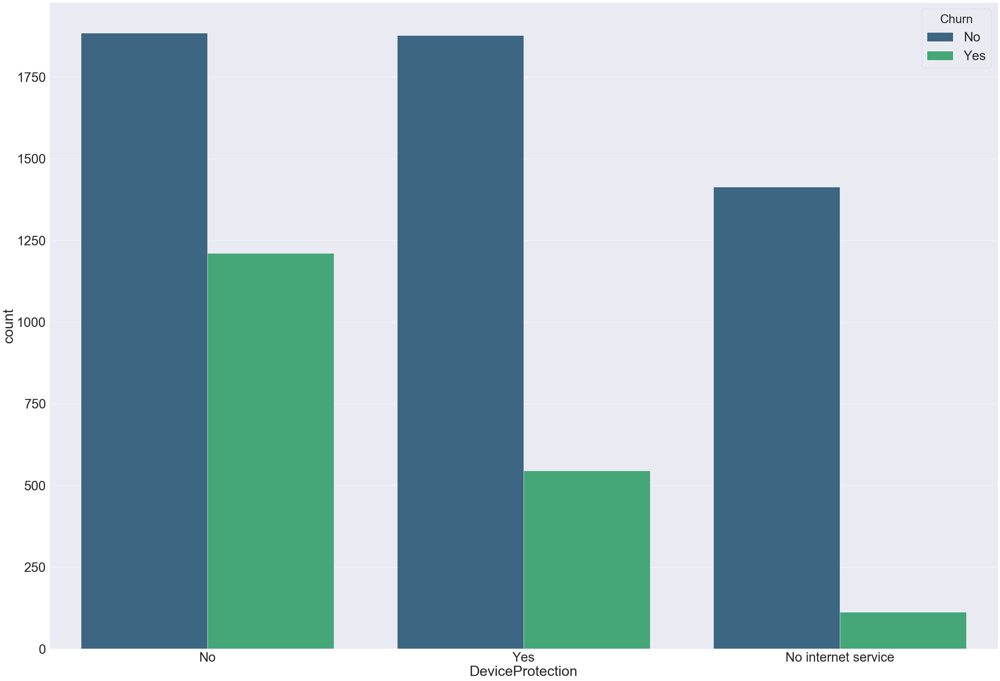

In [125]:
sns.countplot(x = "DeviceProtection" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of DeviceProtection  Based on Churn ")


* From The result above we can see That ::
    * On The No_Churn Case ::
        * The Count of Clients who  Use , No_Use  Device_protection and No_internet_Services large.
    * On The Yes_Churn Case ::
        * The Count of Clients who  Use , No_Use Device_protection and No_internet_Services Less.

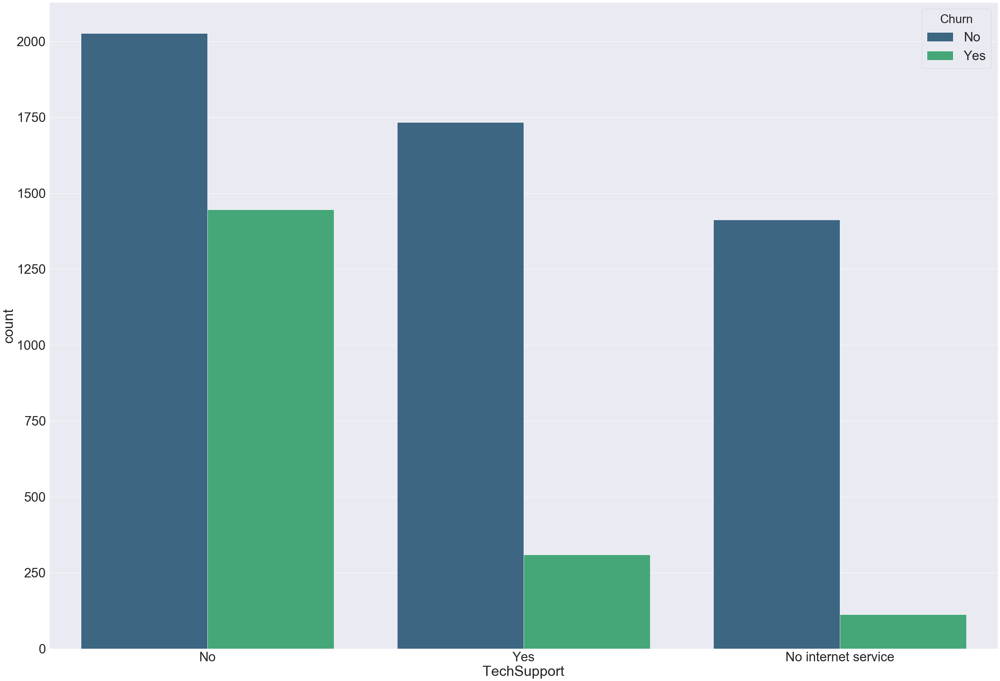

In [126]:
sns.countplot(x = "TechSupport" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of TechSupport  Based on Churn ")


* From The result above we can see That ::
    * On The No_Churn Case ::
        * The Count of Clients who  Use , No_Use Tech_Support and No_internet_services large.
    * On The Yes_Churn Case ::
        * The Count of Clients who  Use , No_Use Tech_Support and No_internet_services Less.

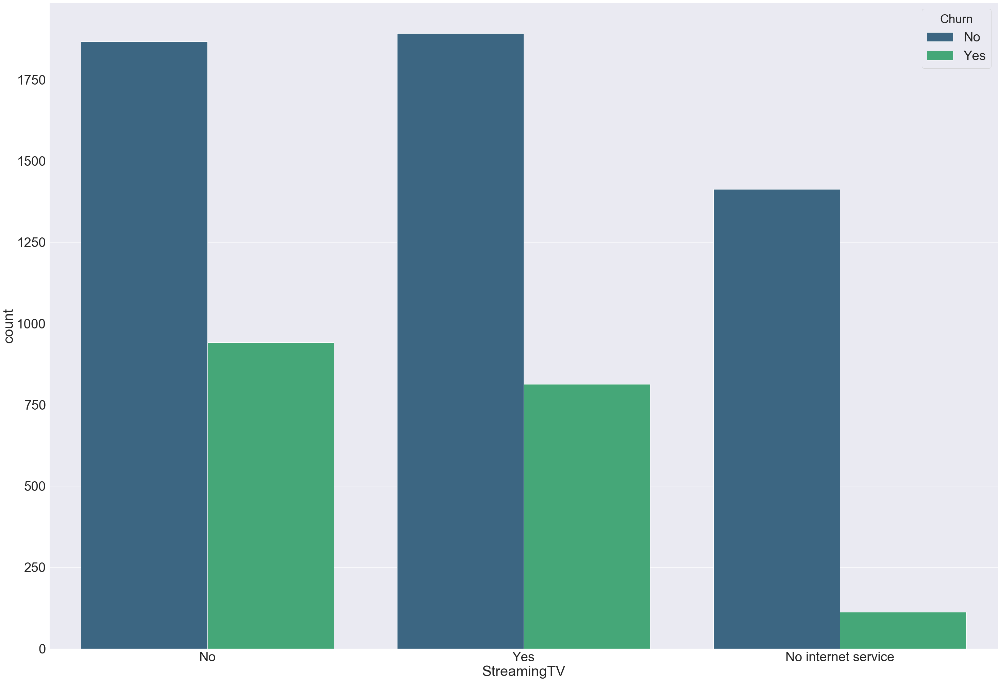

In [127]:
sns.countplot(x = "StreamingTV" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of StreamingTV  Based on Churn ")


* From The result above we can see That ::
    * On The No_Churn Case ::
        * The Count of Clients who  Use , No_Use StreamingTV and No_internet_services large.
    * On The Yes_Churn Case ::
        * The Count of Clients who  Use , No_Use StreamingTV and No_internet_services Less.

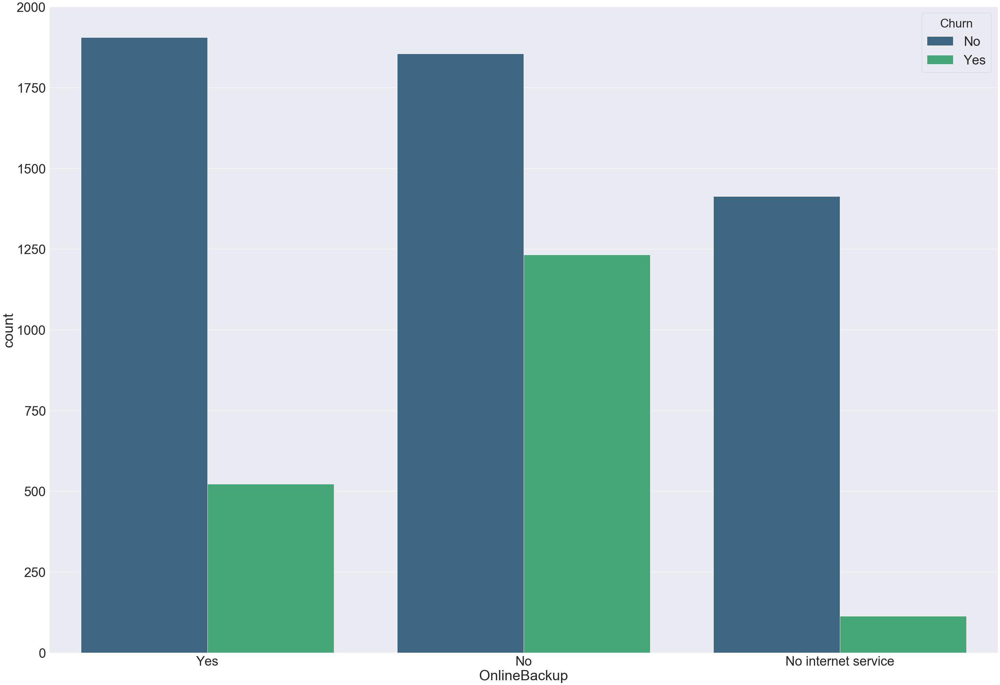

In [128]:
sns.countplot(x = "OnlineBackup" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of OnlineBackup  Based on Churn ")


* From The result above we can see That ::
    * On The No_Churn Case ::
        * The Count of Clients who  Use , No_Use OnlineBacUp and No_internet_services large.
    * On The Yes_Churn Case ::
        * The Count of Clients who  Use , No_Use OnlineBacUp and No_internet_services Less.

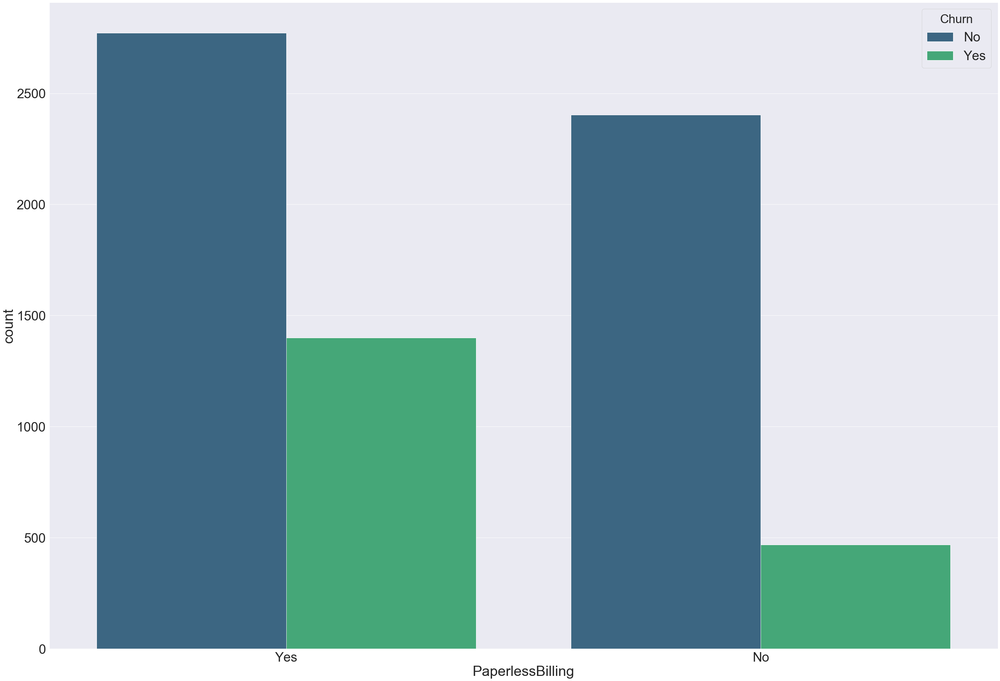

In [129]:
sns.countplot(x = "PaperlessBilling" , data = df , hue = "Churn" , palette="viridis")
plt.title("Count Plot of PaperlessBilling  Based on Churn ")


* From The result above we can see That ::
    * On The No_Churn Case ::
        * The Count of Clients who  Use , No_Use PaperrlessBing  large.
    * On The Yes_Churn Case ::
        * The Count of Clients who  Use , No_Use PaperrlessBing  Less.

# (5) :: ETL :: (Extract Transform Load) ::



# 1 :: Feature_Engineering Technice ::

* Its one of the most important phase in data scientist life cycle which use to generate new usefull features from the old  features which not enough for train model.

In [130]:
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


* Form The Result above we not Found any Feature of data we can apply that technice on it to generate new features.

# 2 :: Transform_data ::

* 2 :: *Cleancing data* ::
     * Data in the real state dont comes cleaned is come dirty may include ::
         * non_logic_data_values.
         * Noisy and Errors.
         * Duplicaties data.
         * Missing_data_Values.
            
            

In [131]:
# Check data include Non_logic data_Values ::

for col in df.columns :
    print(f"The Col ({col})\n")
    print(f"The Unique Values of ({col}) :: {df[col].unique()}\n\n")
    print(f"The Value_Counts of ({col}) :: \n{df[col].value_counts()}")
    print("-" * 80)

The Col (customerID)

The Unique Values of (customerID) :: ['7590-VHVEG' '5575-GNVDE' '3668-QPYBK' ... '4801-JZAZL' '8361-LTMKD'
 '3186-AJIEK']


The Value_Counts of (customerID) :: 
1945-XISKS    1
7596-IIWYC    1
5073-WXOYN    1
6203-HBZPA    1
6993-YCOBK    1
             ..
5198-EFNBM    1
9800-ONTFE    1
0486-LGCCH    1
5203-XEHAX    1
0234-TEVTT    1
Name: customerID, Length: 7043, dtype: int64
--------------------------------------------------------------------------------
The Col (gender)

The Unique Values of (gender) :: ['Female' 'Male']


The Value_Counts of (gender) :: 
Male      3555
Female    3488
Name: gender, dtype: int64
--------------------------------------------------------------------------------
The Col (SeniorCitizen)

The Unique Values of (SeniorCitizen) :: [0 1]


The Value_Counts of (SeniorCitizen) :: 
0    5901
1    1142
Name: SeniorCitizen, dtype: int64
--------------------------------------------------------------------------------
The Col (Partner)

The Un

* From the result above we can see some Observations ::
   * There are Not any non_logic_data_Values.

In [132]:
# 

In [133]:
# detect duplicated data ::

df.duplicated().sum()

0

* FromThe result above we not find duplicated data .

In [134]:
# To confirm that ::
df.drop_duplicates(inplace=True)

In [135]:
# detect missing data values ::

df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

* From The result above we cann see that data not include any Missing values.

In [136]:
# Dropping NAN_Values
df.dropna(inplace=True)

* 3 :: *Data_Preprocessing* ::
    * Data may include ::
        * Outliers values.
        * Impalanced classes.
        * Text data.

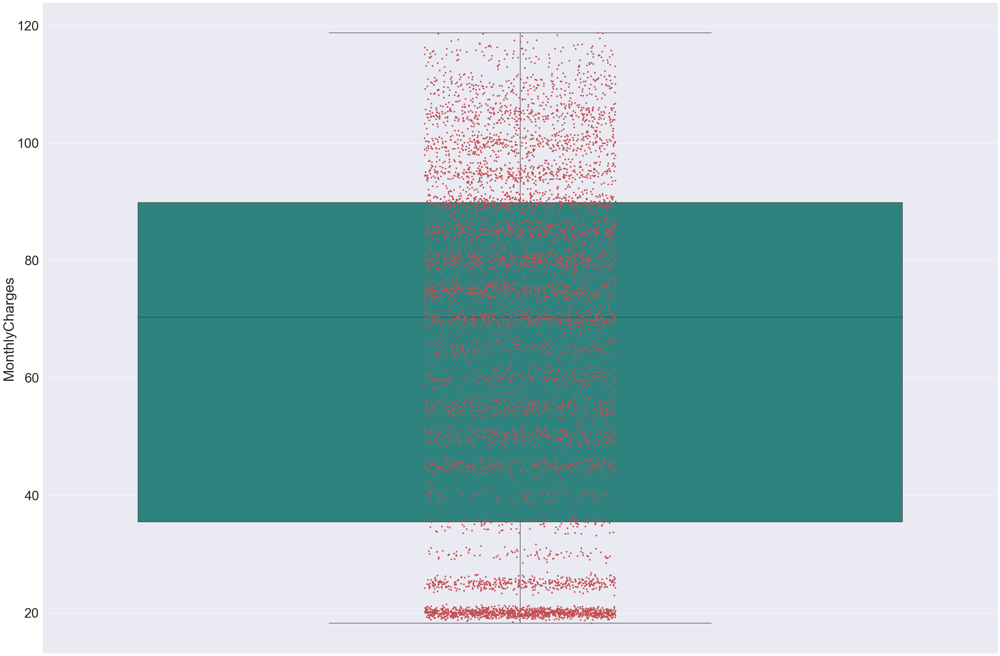

In [137]:
# detect outliers values in MonthlyCharges feature ::

sns.boxplot(y = "MonthlyCharges" , data = df , palette="viridis")
sns.stripplot(y = "MonthlyCharges" , data = df , color = "r")

* From the result above we can see that the MonthlyCharges feature not include outliers values.

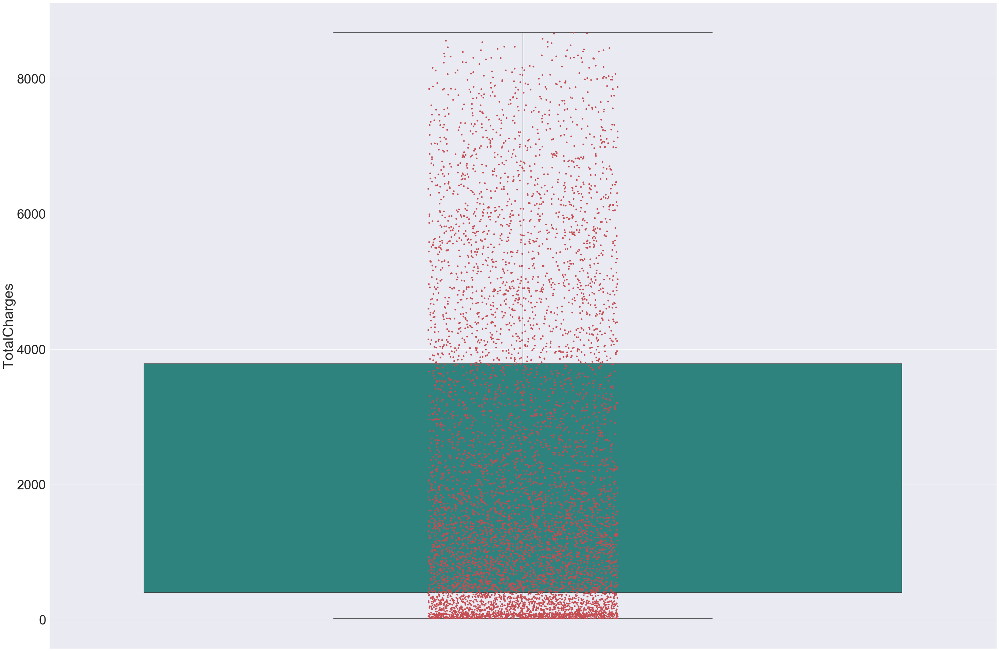

In [138]:
# detect outliers values in TotalCharges feature ::

sns.boxplot(y = "TotalCharges" , data = df , palette="viridis")
sns.stripplot(y = "TotalCharges" , data = df , color = "r")

* From the result above we can see that the MonthlyCharges feature not include outliers values.

* *Processing Text data* ::

In [139]:
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.50,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.90,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.60,Yes


* From the result above we can see that all Text features are Nominal categorical data so that we will apply dummies variable encoding technice

In [140]:
#Droping ["customerID" , "Unnamed: 0"] columns
df.drop(["customerID" ] , axis=1 , inplace=True)

In [141]:
#Convertin the predictor variable in a binary numeric variable
df['Churn'].replace(to_replace='Yes', value=1, inplace=True)
df['Churn'].replace(to_replace='No',  value=0, inplace=True)


In [142]:
df = pd.get_dummies(df , drop_first = True)

In [143]:
df

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,Churn,gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,...,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No internet service,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
0,0,1,29.85,29.85,0,0,1,0,0,1,...,0,0,0,0,0,0,1,0,1,0
1,0,34,56.95,1889.50,0,1,0,0,1,0,...,0,0,0,0,1,0,0,0,0,1
2,0,2,53.85,108.15,1,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1
3,0,45,42.30,1840.75,0,1,0,0,0,1,...,0,0,0,0,1,0,0,0,0,0
4,0,2,70.70,151.65,1,0,0,0,1,0,...,0,0,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,0,24,84.80,1990.50,0,1,1,1,1,0,...,0,1,0,1,1,0,1,0,0,1
7039,0,72,103.20,7362.90,0,0,1,1,1,0,...,0,1,0,1,1,0,1,1,0,0
7040,0,11,29.60,346.45,0,0,1,1,0,1,...,0,0,0,0,0,0,1,0,1,0
7041,1,4,74.40,306.60,1,1,1,0,1,0,...,0,0,0,0,0,0,1,0,0,1


                                       SeniorCitizen    tenure  \
SeniorCitizen                               1.000000  0.010834   
tenure                                      0.010834  1.000000   
MonthlyCharges                              0.049649  0.041647   
TotalCharges                                0.023880  0.108142   
Churn                                       0.150889 -0.144351   
gender_Male                                -0.001874 -0.000013   
Partner_Yes                                -0.016479 -0.101985   
Dependents_Yes                             -0.211185  0.048514   
PhoneService_Yes                            0.008576 -0.018799   
MultipleLines_No phone service              0.008576 -0.018799   
MultipleLines_Yes                           0.142948  0.093908   
InternetService_Fiber optic                 0.255338  0.010385   
InternetService_No                         -0.182742 -0.017008   
OnlineSecurity_No internet service         -0.182742 -0.017008   
OnlineSecu

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges,Churn,gender_Male,Partner_Yes,Dependents_Yes,PhoneService_Yes,MultipleLines_No phone service,...,DeviceProtection_Yes,TechSupport_Yes,StreamingTV_Yes,StreamingMovies_Yes,Contract_One year,Contract_Two year,PaperlessBilling_Yes,PaymentMethod_Credit card (automatic),PaymentMethod_Electronic check,PaymentMethod_Mailed check
SeniorCitizen,1.000000,0.016567,0.220173,0.102395,0.150889,-0.001874,0.016479,-0.211185,0.008576,-0.008576,...,0.059428,-0.060625,0.105378,0.120176,-0.046262,-0.117000,0.156530,-0.024135,0.171718,-0.153477
tenure,0.016567,1.000000,0.247900,0.824757,-0.352229,0.005106,0.379697,0.159712,0.008448,-0.008448,...,0.360653,0.324221,0.279756,0.286111,0.202570,0.558533,0.006152,0.233006,-0.208363,-0.233852
MonthlyCharges,0.220173,0.247900,1.000000,0.650468,0.193356,-0.014569,0.096848,-0.113890,0.247398,-0.247398,...,0.482692,0.338304,0.629603,0.627429,0.004904,-0.074681,0.352150,0.030550,0.271625,-0.377437
TotalCharges,0.102395,0.824757,0.650468,1.000000,-0.199428,0.000048,0.318812,0.064535,0.112851,-0.112851,...,0.522462,0.432480,0.515314,0.519574,0.170491,0.357224,0.157676,0.182581,-0.060412,-0.294125
Churn,0.150889,-0.352229,0.193356,-0.199428,1.000000,-0.008612,-0.150448,-0.164221,0.011942,-0.011942,...,-0.066160,-0.164674,0.063228,0.061382,-0.177820,-0.302253,0.191825,-0.134302,0.301919,-0.091683


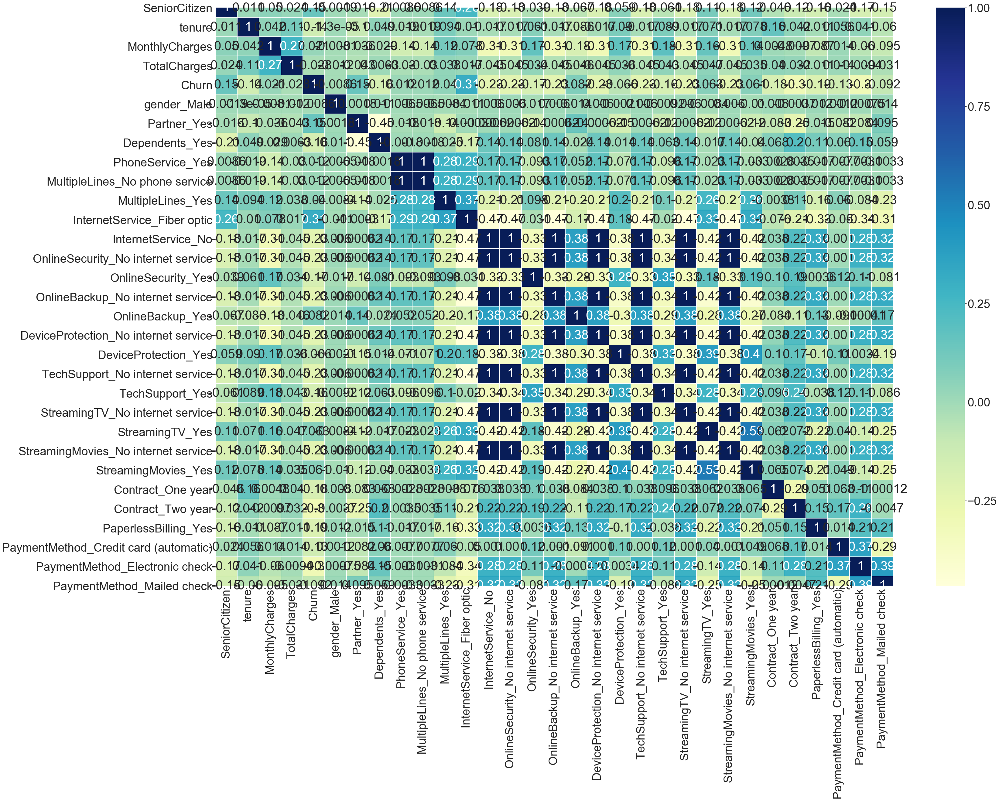

In [182]:
#Create a heatmap


# We will get the numeric representation of the object columns to numeric ones by applying pd.factorize.
corr = df.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
                 linewidths=.2, cmap="YlGnBu", annot=True)



#lets first use the pearson coefficient to check the correlation
print(df.apply(lambda x : pd.factorize(x)[0]).corr(method='pearson', min_periods=1))  

#check the correlation between columns which is greater than 0.95
corr = df.corr()
columns = np.full((corr.shape[0],), True, dtype=bool)
for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.95:
            if columns[j]:
                columns[j] = False
                
selected_columns = corr.columns[columns]
corr = corr[selected_columns]
corr.head()

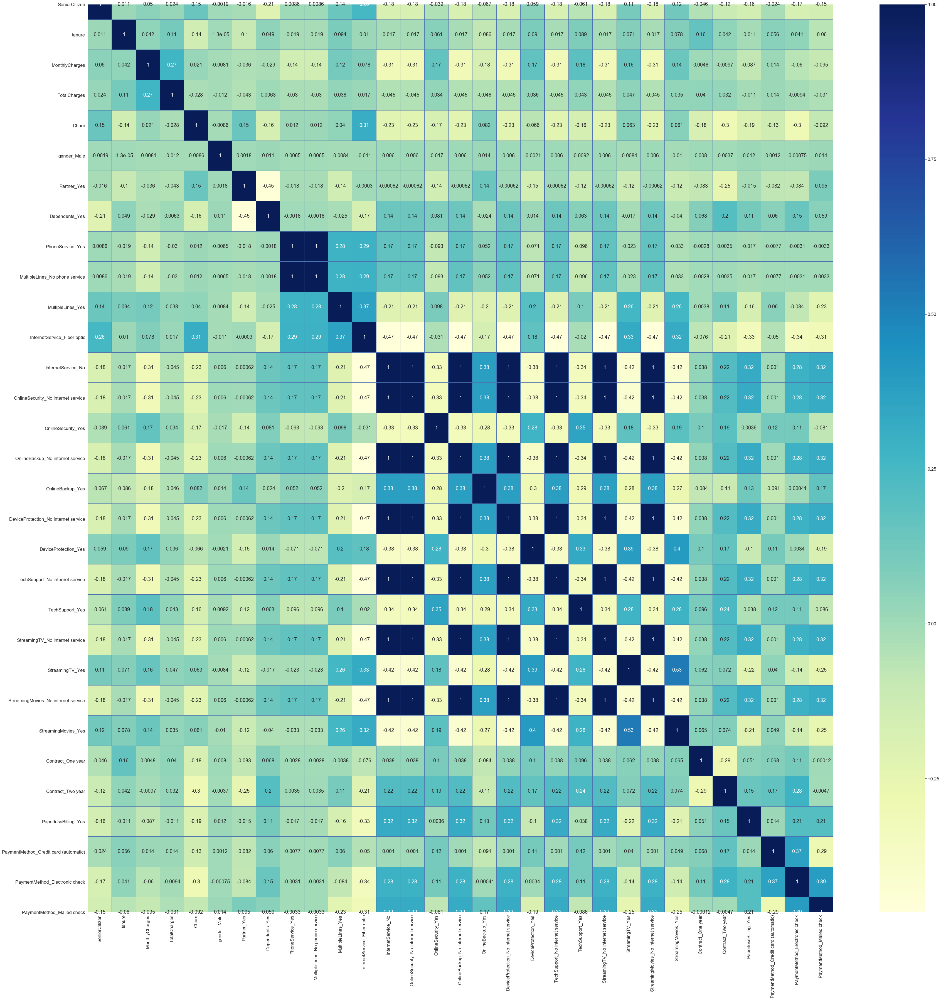

In [190]:
sns.set( rc = {"figure.figsize" : [60 , 60]} , font_scale=1.5)
corr = df.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, 
                 linewidths=.2, cmap="YlGnBu", annot=True , linecolor="b")

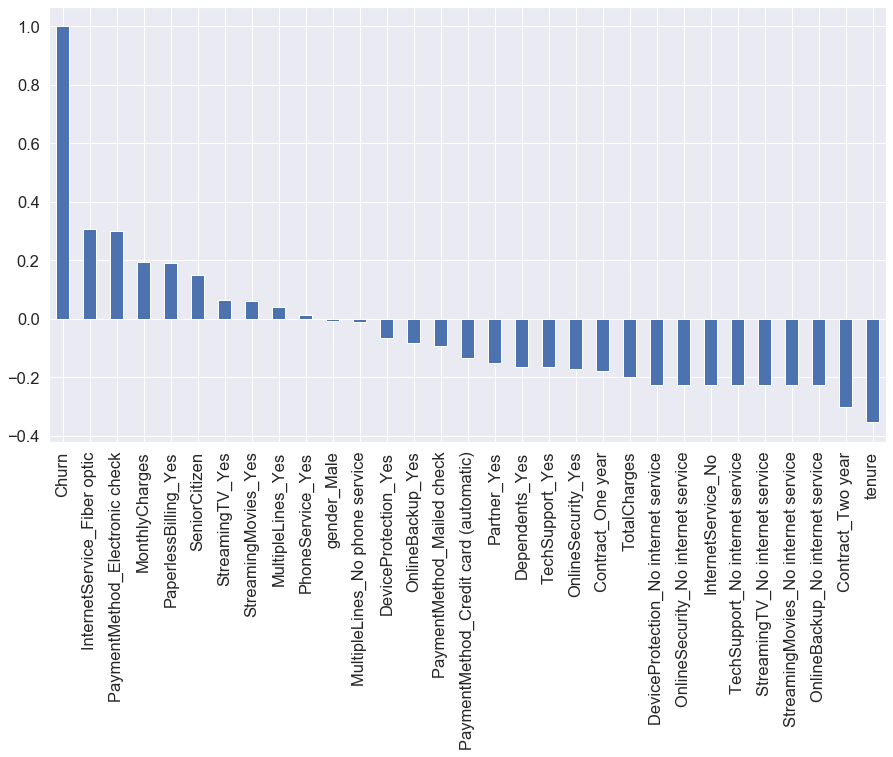

In [178]:
#Get Correlation of "Churn" with other variables:
sns.set( rc = {"figure.figsize" : [10 , 10]} , font_scale=1.5)

plt.figure(figsize=(15,8))
df.corr()['Churn'].sort_values(ascending = False).plot(kind='bar'  )

* Month to month contracts, absence of online security and tech support seem to be positively correlated with churn. While, tenure, two year contracts seem to be negatively correlated with churn.

* Interestingly, services such as Online security, streaming TV, online backup, tech support, etc. without internet connection seem to be negatively related to churn.

* We will explore the patterns for the above correlations below before we delve into modelling and identifying the important variable

In [146]:
# Spliting data  input data and output data ::
x = df.drop("Churn" , axis=1 )
y = df["Churn"]

# 3 :: Feture selection ::

* There are multi technices to get the most Correlation Columns with our target.

In [147]:
# importing Liberaries and Features Selction technices ::

from sklearn.feature_selection import SelectKBest , SelectPercentile , SelectFromModel
from sklearn.feature_selection import chi2 , f_classif , mutual_info_classif
from sklearn.ensemble import RandomForestClassifier

In [148]:
# Create Object from the Class of selections
#selector1 = SelectKBest( k = 15 , score_func=chi2)
#selector2 = SelectPercentile( percentile = 95 , score_func=chi2)
#Create Object from Model selection::
#RFC_Model = RandomForestClassifier( criterion="gini" , random_state =20 )
#selector3 = SelectFromModel(estimator=RFC_Model)

In [149]:
#selector = SelectFromModel(estimator=RFC_Model)
#selector.fit(x , y)

In [150]:
#All_Features = x.columns
#All_Features

In [151]:
#selected_feature_idx = selector.get_support(indices=True)
#selected_feature_idx

In [152]:
#selected_features =  All_Features[selected_feature_idx]
#selected_features

# (6) :: Prepration data for Train and Test Model

In [153]:
# Spliting data into Training and Testing data ::
from sklearn.model_selection import train_test_split
x_train , x_test , y_train , y_test = train_test_split( x , y , random_state = 20 , test_size=0.2)

In [ ]:
# (7) :: Scalling data in the normal distribution

In [154]:
 #Scalling data ::
from sklearn.preprocessing import StandardScaler
scaller = StandardScaler()
x_train = scaller.fit_transform(x_train)
x_test  = scaller.transform(x_test)

#*************************************************************
#*************************************************************

#from sklearn.preprocessing import MinMaxScaler
#scaller = MinMaxScaler()
#x_train = scaller.fit_transform(x_train)
#x_test  = scaller.transform(x_test)

In [155]:
# Smote data ::

#from imblearn.over_sampling import SMOTE
#SM = SMOTE()
#x_train , y_train = SM.fit_resample(x_train , y_train)

In [156]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 31 columns):
SeniorCitizen                            7043 non-null int64
tenure                                   7043 non-null int64
MonthlyCharges                           7043 non-null float64
TotalCharges                             7043 non-null float64
Churn                                    7043 non-null int64
gender_Male                              7043 non-null uint8
Partner_Yes                              7043 non-null uint8
Dependents_Yes                           7043 non-null uint8
PhoneService_Yes                         7043 non-null uint8
MultipleLines_No phone service           7043 non-null uint8
MultipleLines_Yes                        7043 non-null uint8
InternetService_Fiber optic              7043 non-null uint8
InternetService_No                       7043 non-null uint8
OnlineSecurity_No internet service       7043 non-null uint8
OnlineSecurity_Yes                 

# (8) :: Bulding Models For Classification

In [157]:
# Import All Classification Algos ::
from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score , confusion_matrix 
from sklearn.metrics import classification_report , f1_score , precision_recall_curve

In [158]:
Models = {"Log_Classifer" : LogisticRegression() ,
          "DT_Classifer"  : DecisionTreeClassifier() ,
          "RF_Classifer"  : RandomForestClassifier() ,
          "XGB_Classifer" : XGBClassifier() ,
          "SVC_Classifer" : SVC()
         }

In [159]:
for Name , Model in Models.items() :
    print(f"The Model :: {Name}\n----------")
    Model.fit(x_train , y_train)
    Train_score = Model.score(x_train , y_train)
    Test_score  = Model.score(x_test , y_test)
    y_pred = Model.predict(x_test)
    Acurace_Score = accuracy_score(y_test , y_pred)
    Con_Matrix = confusion_matrix(y_test , y_pred)
    print(f"The Traing_Score :: {Train_score}\nThe Testing_Score :: {Test_score}\nThe Accuracy_Scor :: {Acurace_Score}\nThe Con_Matrix ::\n {Con_Matrix}\n--------------\n----")

The Model :: Log_Classifer
----------
The Traing_Score :: 0.8013844515441959
The Testing_Score :: 0.8190205819730305
The Accuracy_Scor :: 0.8190205819730305
The Con_Matrix ::
 [[945 118]
 [137 209]]
--------------
----
The Model :: DT_Classifer
----------
The Traing_Score :: 0.9976925807596734
The Testing_Score :: 0.7260468417317246
The Accuracy_Scor :: 0.7260468417317246
The Con_Matrix ::
 [[842 221]
 [165 181]]
--------------
----
The Model :: RF_Classifer
----------
The Traing_Score :: 0.9976925807596734
The Testing_Score :: 0.8041163946061036
The Accuracy_Scor :: 0.8041163946061036
The Con_Matrix ::
 [[947 116]
 [160 186]]
--------------
----
The Model :: XGB_Classifer
----------


C:\Users\Ahmed\AppData\Roaming\Python\Python37\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[18:05:00] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
The Traing_Score :: 0.9321973730919417
The Testing_Score :: 0.7963094393186657
The Accuracy_Scor :: 0.7963094393186657
The Con_Matrix ::
 [[925 138]
 [149 197]]
--------------
----
The Model :: SVC_Classifer
----------
The Traing_Score :: 0.8154064607738729
The Testing_Score :: 0.8133427963094393
The Accuracy_Scor :: 0.8133427963094393
The Con_Matrix ::
 [[957 106]
 [157 189]]
--------------
----


# (9) :: Select most efficient model with high Performance and accuracy

In [160]:

RF_Model = RandomForestClassifier(criterion="entropy" , random_state =20 ,oob_score = True, n_estimators=1000 , max_depth=100, n_jobs=-1 )
RF_Model.fit(x_train , y_train)
print(RF_Model.score(x_train , y_train))
print(RF_Model.score(x_test , y_test))
print("-" * 80)


0.9976925807596734
0.8105039034776437
--------------------------------------------------------------------------------


# (10) :: Estimate and Evaluate model accuracy

In [161]:
RF_Model.score(x_train , y_train)

0.9976925807596734

In [162]:
RF_Model.score(x_test , y_test)

0.8105039034776437

In [163]:
Ac_Sore_RF = accuracy_score(y_test , y_pred)
Ac_Sore_RF

0.8133427963094393

In [164]:
con_Matrix = confusion_matrix(y_test , y_pred)
con_Matrix

array([[957, 106],
       [157, 189]], dtype=int64)

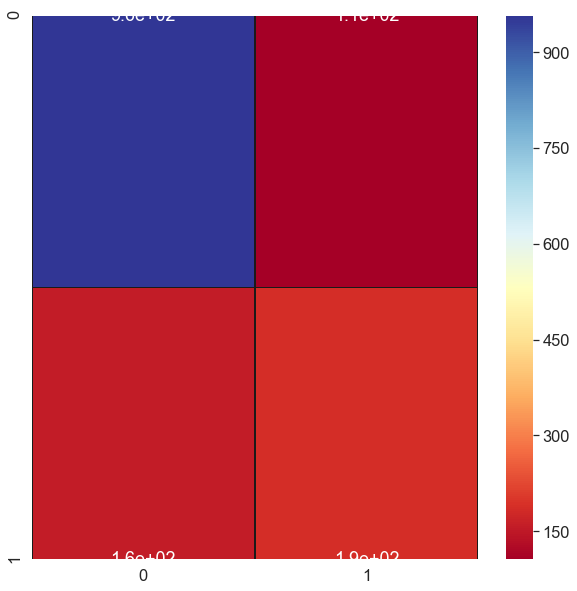

In [165]:
sns.set( rc = {"figure.figsize" : [10 , 10]} , font_scale=1.5)

sns.heatmap(con_Matrix , annot = True , cmap="RdYlBu" , linecolor = 'k' , linewidths= 1)

# (11) :: Loading the scaler and Model as file :: 

In [166]:
import joblib

In [167]:
scaler = joblib.dump(scaller , "scaler.h5")

In [168]:
Model = joblib.dump(RF_Model , "Model.h5")

# (12) :: Classification Client Churn

In [169]:
x.columns

Index(['SeniorCitizen', 'tenure', 'MonthlyCharges', 'TotalCharges',
       'gender_Male', 'Partner_Yes', 'Dependents_Yes', 'PhoneService_Yes',
       'MultipleLines_No phone service', 'MultipleLines_Yes',
       'InternetService_Fiber optic', 'InternetService_No',
       'OnlineSecurity_No internet service', 'OnlineSecurity_Yes',
       'OnlineBackup_No internet service', 'OnlineBackup_Yes',
       'DeviceProtection_No internet service', 'DeviceProtection_Yes',
       'TechSupport_No internet service', 'TechSupport_Yes',
       'StreamingTV_No internet service', 'StreamingTV_Yes',
       'StreamingMovies_No internet service', 'StreamingMovies_Yes',
       'Contract_One year', 'Contract_Two year', 'PaperlessBilling_Yes',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check'],
      dtype='object')

In [170]:
custom_data = np.array([ 0 , 40 , 50 , 80 , 1 , 0 , 1 , 1 , 0 , 1 , 1 , 0 , 0 , 1 , 0 , 1 , 0 , 1 , 0 , 1 , 0 , 1 ,  0 , 1 , 0 , 1 , 1 , 0 , 1 , 0 ])

In [171]:
custom_data.shape

(30,)

In [172]:
custom_data = scaller.transform([custom_data])
custom_data

array([[-0.43832482,  0.31699359, -0.4935269 , -0.97384846,  0.9964564 ,
        -0.9637383 ,  1.52443229,  0.32491999, -0.32491999,  1.16631251,
         1.12367727, -0.52600621, -0.52600621,  1.58715172, -0.52600621,
         1.37126515, -0.52600621,  1.38370534, -0.52600621,  1.55388077,
        -0.52600621,  1.25967331, -0.52600621,  1.26534898, -0.51829836,
         1.79449846,  0.83241135, -0.52408075,  1.40021018, -0.54768043]])

In [173]:
prediction = RF_Model.predict(custom_data)
prediction

array([0], dtype=int64)

# Insert New_data of Client for regression its Churn

* The Sequantial of input features ::
    * SeniorCitizen
    * tenure
    * MonthlyCharges
    * TotalCharges
    * gender_Male
    * Partner_Yes
    * Dependents_Yes
    * PhoneService_Yes
    * MultipleLines_No phone service
    * MultipleLines_Yes
    * InternetService_Fiber optic
    * InternetService_No
    * OnlineSecurity_No internet service
    * OnlineSecurity_Yes
    * OnlineBackup_No internet service
    * OnlineBackup_Yes
    * DeviceProtection_No internet service
    * DeviceProtection_Yes
    * TechSupport_No internet service
    * TechSupport_Yes
    * StreamingTV_No internet service
    * StreamingTV_Yes
    * StreamingMovies_No internet service
    * StreamingMovies_Yes
    * Contract_One year
    * Contract_Two year
    * PaperlessBilling_Yes
    * PaymentMethod_Credit card (automatic)
    * PaymentMethod_Electronic check
    * PaymentMethod_Mailed check
    ****************************************************************************
    
    

In [174]:
from sklearn.ensemble import RandomForestClassifier


# Cearte Function For Classification Client Churn   ::

In [175]:
def Prediction_chrun () :
    SeniorCitizen    = int(input("Enter The value of SeniorCitizen Plz :: "))
    tenure           = int(input("Enter The value of tenure Plz :: "))
    MonthlyCharges   = float(input("Enter The value of MonthlyCharges Plz :: "))
    TotalCharges     = float(input("Enter The value of TotalCharges Plz :: "))
    gender_Male      = int(input("Enter The value of gender_Male Plz :: "))
    Partner_Yes      = int(input("Enter The value of Partner_Yes Plz :: "))
    Dependents_Yes   = int(input("Enter The value of Dependents_Yes Plz :: "))
    PhoneService_Yes = int(input("Enter The value of PhoneService_Yes Plz :: "))
    MultipleLines_No_phone_ser  = int(input("Enter The value of MultipleLines_No phone service Plz :: "))
    MultipleLines_Yes           = int(input("Enter The value of MultipleLines_Yes Plz :: "))
    InternetService_Fiber       = int(input("Enter The value of InternetService_Fiber optic Plz :: "))
    InternetService_No          = int(input("Enter The value of InternetService_No Plz :: "))
    OnlineSecurity_No_net_ser   = int(input("Enter The value of OnlineSecurity_No internet service Plz :: "))
    OnlineSecurity_Yes          = int(input("Enter The value of OnlineSecurity_Yes Plz :: "))
    OnlineBackup_No_net_ser     = int(input("Enter The value of OnlineBackup_No internet service Plz :: "))
    OnlineBackup_Yes            = int(input("Enter The value of OnlineBackup_Yes Plz :: "))
    DeviceProtection_No_net_ser = int(input("Enter The value of DeviceProtection_No internet service Plz :: "))
    DeviceProtection_Yes        = int(input("Enter The value of DeviceProtection_Yes Plz :: "))
    TechSupport_No_net_ser      = int(input("Enter The value of TechSupport_No internet service Plz :: "))
    TechSupport_Yes             = int(input("Enter The value of TechSupport_Yes Plz :: "))
    StreamingTV_No_net_ser      = int(input("Enter The value of StreamingTV_No internet service Plz :: "))
    StreamingTV_Yes             = int(input("Enter The value of StreamingTV_Yes Plz :: "))
    StreamingMovies_No_net_ser  = int(input("Enter The value of StreamingMovies_No internet service Plz :: "))
    StreamingMovies_Yes         = int(input("Enter The value of StreamingMovies_Yes Plz :: "))
    Contract_One_year           = int(input("Enter The value of Contract_One year Plz :: "))
    Contract_Two_year           = int(input("Enter The value of Contract_Two year Plz :: "))
    PaperlessBilling_Yes        = int(input("Enter The value of PaperlessBilling_Yes Plz :: "))
    PaymentMethod_Credit_card = int(input("Enter The value of PaymentMethod_Credit Plz :: "))
    PaymentMethod_Electronic_check        = int(input("Enter The value of PaymentMethod_Electronic check Plz :: "))
    PaymentMethod_Mailed_check             = int(input("Enter The value of PaymentMethod_Mailed check Plz :: "))
    
    predict_features = {"SeniorCitizen" : SeniorCitizen , "tenure" : tenure , "MonthlyCharges" : MonthlyCharges ,
                        "TotalCharges"  : TotalCharges  , "gender_Male" : gender_Male , "Partner_Yes" : Partner_Yes ,
                        "Dependents_Yes" : Dependents_Yes , "PhoneService_Yes" : PhoneService_Yes , "MultipleLines_No phone service" :  MultipleLines_No_phone_ser ,
                        "MultipleLines_Yes" : MultipleLines_Yes , "InternetService_Fiber optic" : InternetService_Fiber ,
                        "InternetService_No" : InternetService_No , "OnlineSecurity_No internet service" : OnlineSecurity_No_net_ser , "OnlineSecurity_Yes" :OnlineSecurity_Yes ,
                        "OnlineBackup_No internet service" : OnlineBackup_No_net_ser , "OnlineBackup_Yes" : OnlineBackup_Yes ,
                        "DeviceProtection_No internet service" : DeviceProtection_No_net_ser , "DeviceProtection_Yes" : DeviceProtection_Yes ,
                        "TechSupport_No internet service" : TechSupport_No_net_ser , "TechSupport_Yes" : TechSupport_Yes , 
                        "StreamingTV_No internet service" : StreamingTV_No_net_ser , "StreamingTV_Yes" : StreamingTV_Yes ,
                        "StreamingMovies_No internet service" : StreamingMovies_No_net_ser , "StreamingMovies_Yes" :StreamingMovies_Yes ,
                        "Contract_One year" : Contract_One_year , "Contract_Two year" :Contract_Two_year , "PaperlessBilling_Yes" : PaperlessBilling_Yes, 
                        "PaymentMethod_Credit card (automatic)" : PaymentMethod_Credit_card ,
                        "PaymentMethod_Electronic check" : PaymentMethod_Electronic_check ,
                        "PaymentMethod_Mailed check" : PaymentMethod_Mailed_check
                       
                       }
    
    #RF_Model = RandomForestClassifier(criterion="entropy" , random_state =20 ,oob_score = True, n_estimators=1000 , max_depth=100, n_jobs=-1 )
    #RF_Model.fit(x_train , y_train)
    custom_data_values = np.array(list(predict_features.values()))
    custom_data_values = scaller.transform([custom_data_values])
    prediction_Churn = RF_Model(custom_data_values)
    print(f"The Prediction of Churn :: {prediction_Churn}\n-------------\n")
    print("Thx To use our Prediction App My Client (^ _ ^)")
    
    
    

In [176]:
#([ 0 , 40 , 50 , 80 , 1 , 0 , 1 , 1 , 0 , 1 , 1 , 0 , 0 , 1 , 0 , 1 , 0 , 1 , 0 , 1 , 0 , 1 ,  0 , 1 , 0 , 1 , 1 , 0 , 1 , 0 ]

In [177]:
Prediction_chrun()

Enter The value of SeniorCitizen Plz :: 10
Enter The value of tenure Plz :: 5151515
Enter The value of MonthlyCharges Plz :: 56156
Enter The value of TotalCharges Plz :: m


ValueError: could not convert string to float: 'm'